# $\mu E_{BV}R_\lambda$ calibration toolkit for Cepheids

## Dataset Details
Edit './data/datamapping.py' file for switching between dataset and related adjustments.

In [1]:
from data.datamapping import k,s, z, flags, wes_show, del_mu, data_dir, process_step, data_out,img_out_path, plots
from data.datamapping import file_name, data_cols, dis_list, dis_flag, R_v, mag, colors, R_dic, fouque_extinction_ratios
from lvtlaw.a_utils import data_dir, data_out,imgsave
from lvtlaw.a_utils import output_directories, image_directories, load_data, colprint
from lvtlaw.h_loadoutput import *
from lvtlaw.main_modules import intro
#import pandas as pd, matplotlib.pyplot as plt

dis = dis_flag[0]
flag = flags[0]

print(f'\nFile Overwrite: {"Yes" if s == 1 else "No" if s == 0 else "check a_utils.py"} (s = {s})')
print(f'\nDatafile location : ./leavitt_law/data/input/{file_name}.csv (k = {k})')
print(f'\nPhotometry Bands: {mag}')
print(f'\nDistance label: {dis}')
print(f'\nWesenheit Index: {wes_show}')
print(f'\nCalibration Method: {"Madore" if flag == "M" else "Shubham" if flag == "S" else "check a_utils.py"}')
print(f'\nReddening Law (Fouque 2007): {R}')

intro()

* * datamapping module loaded!
* * a_utils module loaded!
* * datamapping module loaded!
* * b_data_transform module loaded!
* * c_pl_pw module loaded!
* * d_del_del module loaded!
* * e_error_estimation module loaded!
* * f_star_wise module loaded!
* * g_result module loaded!
* * main_modules module loaded!

File Overwrite: Yes (s = 1)

Datafile location : ./leavitt_law/data/input/76_IRSB_IJ_HK.csv (k = 1)

Photometry Bands: ['B', 'V', 'I', 'J', 'H', 'K']

Distance label: _j

Wesenheit Index: ['BV', 'BI', 'BJ', 'BH', 'BK', 'VI', 'VJ', 'VH', 'VK', 'IJ', 'IH', 'IK', 'JH', 'JK', 'HK']

Calibration Method: Shubham

Reddening Law (Fouque 2007): {'B': 4.061402, 'V': 3.23, 'I': 1.9670699999999999, 'J': 0.958987, 'H': 0.586568, 'K': 0.397613}
* * * * * * * * * * * * * * * * * * * * 
* * * * * * * * * * * * * * * * * * * * 


Master Thesis Project: 	Galactic BVIJHK Leavitt Law Calibration for R_v = 3.23 

  			To Refine systematic errors in luminosity, distance and reddening of individual Ceph

# Reddening Ratio

./docs/plots/1_datacleaning/Rratio1.pdf


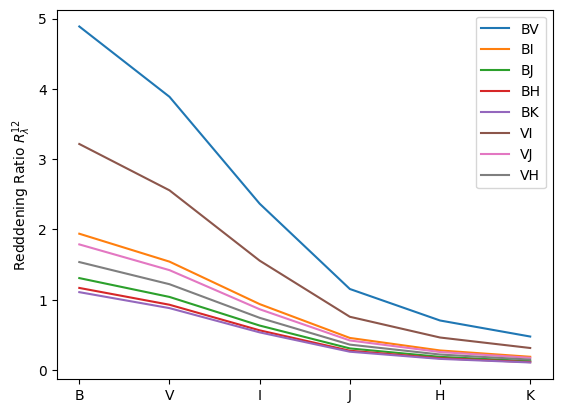

./docs/plots/1_datacleaning/Rratio2.pdf


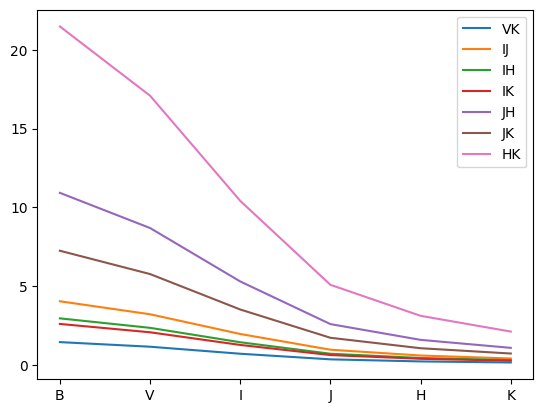

In [2]:
import matplotlib.pyplot as plt
Rm=R_dic(mag)
cols = colors(mag)
for col in cols[0:8]:
    plt.plot([x for x in range(len(mag))],[Rm[f'{m}{col}'] for m in mag], '-', label = col)
plt.ylabel('Redddening Ratio $R_\lambda^{12}$')
plt.legend()
plt.xticks(range(len(mag)), ['B', 'V', 'I', 'J', 'H', 'K'])
imgsave('Rratio1',step=0,img_path='./docs/plots/')
plt.show()
for col in cols[8:]:
    plt.plot([x for x in range(len(mag))],[Rm[f'{m}{col}'] for m in mag], '-', label = col)
plt.legend()
#plt.ylabel('Redddening Ratio $R_\lambda^{12}$')
plt.xticks(range(len(mag)), ['B', 'V', 'I', 'J', 'H', 'K'])
imgsave('Rratio2',step=0,img_path='./docs/plots/')
plt.show()

# Raw Data

In [3]:
from lvtlaw.b_data_transform import plot_corr

raw, absolute, extinction, tabsolute, wesenheit, merged_data = transformation_()  #0
raw
#plot_corr(raw.drop(columns=['name', 'EBV']+dis_list) , Y = 'logP', title = file_name, f=12)

,name,logP,EBV,IRSB,B_mag,V_mag,I_mag,J_mag,H_mag,K_mag
0,SZ Tau,0.498166,0.297051,8.314,7.365,6.526,5.517,4.827,4.414,4.314
1,SS Sct,0.564814,0.351968,10.007,9.165,8.218,7.095,6.381,5.937,5.845
2,QZ Nor,0.578244,0.304691,10.831,9.756,8.869,7.865,7.136,6.733,6.619
3,AD Gem,0.578408,0.110972,12.414,10.547,9.855,9.039,8.527,8.147,8.077
4,YA ur,0.586529,0.360620,11.422,10.512,9.614,8.571,7.743,7.284,7.167
...,...,...,...,...,...,...,...,...,...,...
71,XP up,1.414321,0.358980,12.152,9.702,8.507,7.107,6.180,5.600,5.431
72,RY Vel,1.449158,0.514549,11.632,9.744,8.371,6.834,5.700,5.123,4.928
73,AQ Pup,1.478624,0.464941,12.164,10.081,8.705,7.140,6.102,5.483,5.299
74,UC ar,1.588970,0.225694,10.792,7.469,6.292,5.057,4.193,3.670,3.522


# Period Luminosity relations 

./docs/plots/2_PLPW/76_IRSB_IJ_HK_0BVIJHK_j.pdf


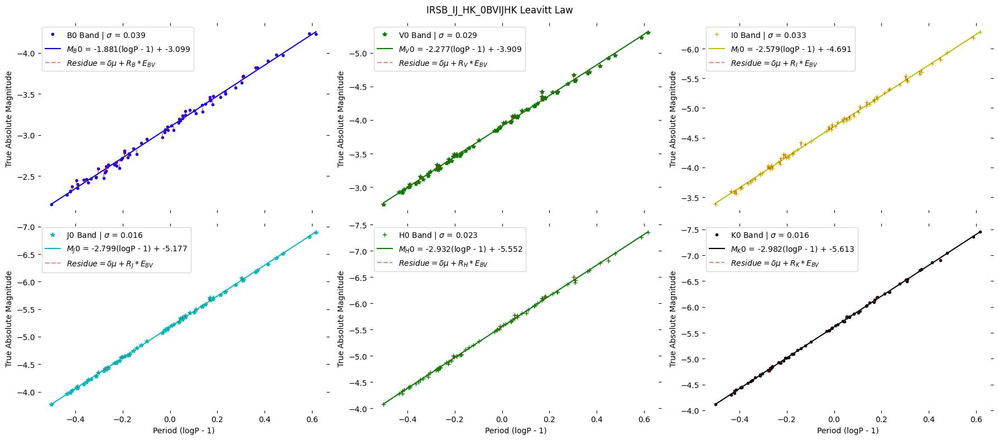

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_0_j_residuals.pdf


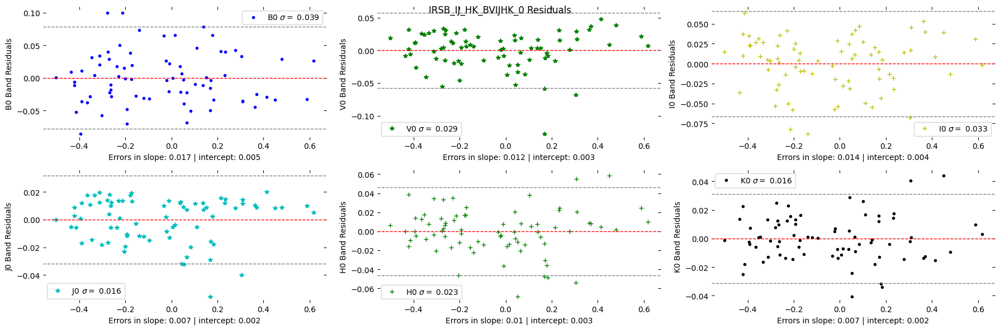

In [5]:
from lvtlaw.c_pl_pw import plotPL6, plotPW6, plotPLWres

PLWregression, PLWresidue, PLWprediction, merged_data=PLWcorrection_() # 1
#plotPL6(merged_data, PLWregression, ab = '')
plotPL6(merged_data, PLWregression, ab = '0')

# Period Wesenheit Relation

Wesenheit  BV
./docs/plots/2_PLPW/76_IRSB_IJ_HK_BV_BVIJHK_j.pdf


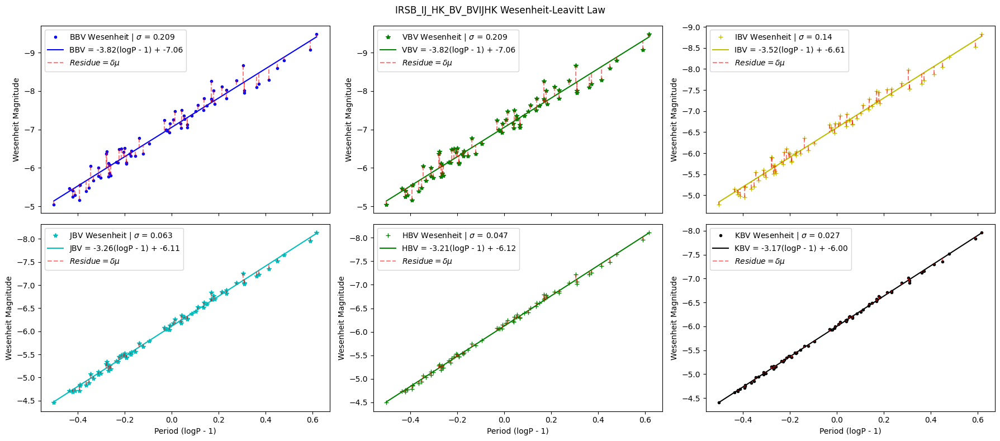

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_BV_j_residuals.pdf


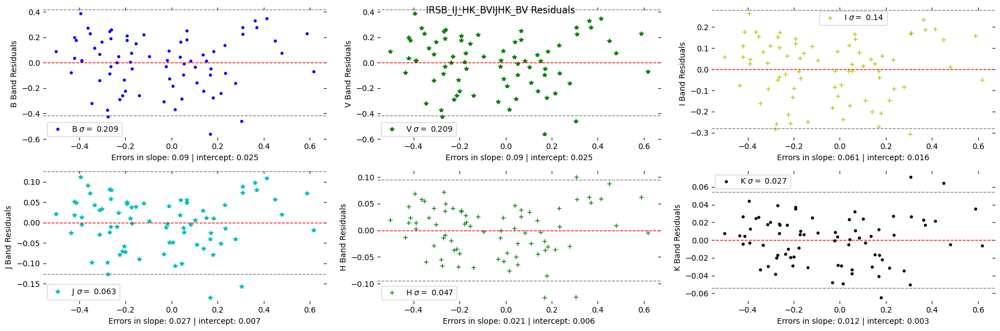

Wesenheit  BI
./docs/plots/2_PLPW/76_IRSB_IJ_HK_BI_BVIJHK_j.pdf


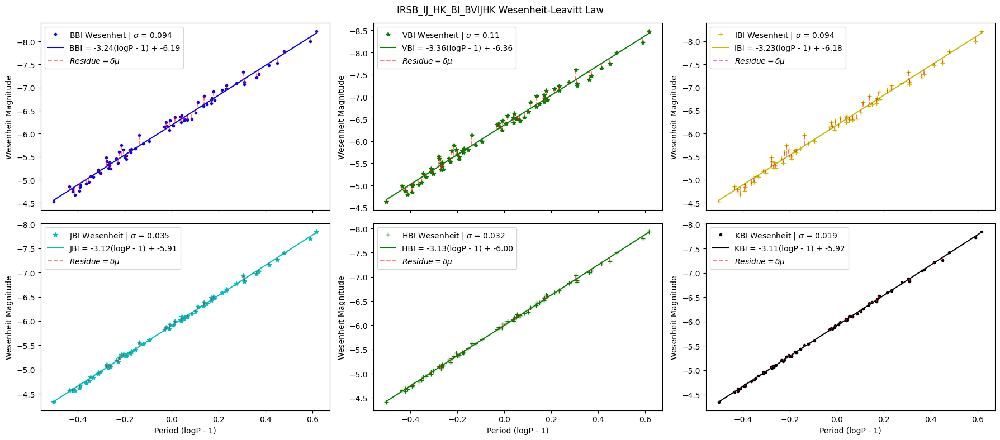

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_BI_j_residuals.pdf


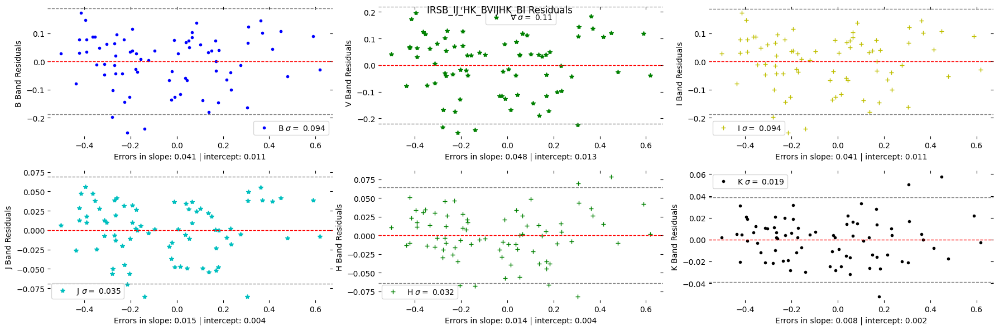

Wesenheit  BJ
./docs/plots/2_PLPW/76_IRSB_IJ_HK_BJ_BVIJHK_j.pdf


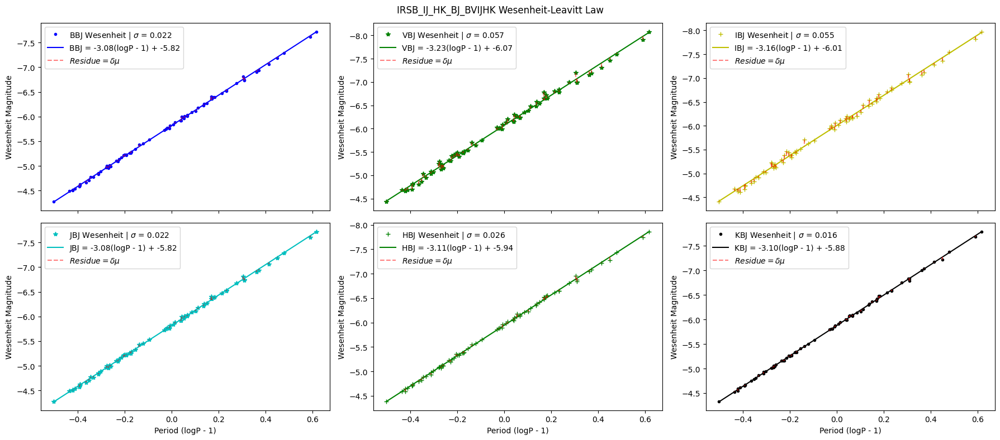

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_BJ_j_residuals.pdf


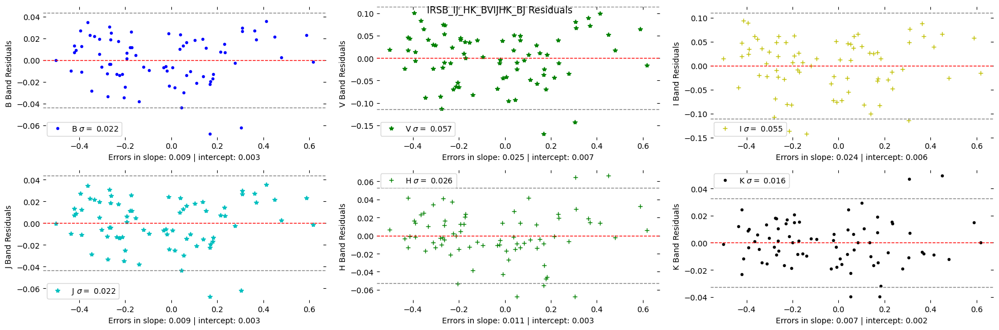

Wesenheit  BH
./docs/plots/2_PLPW/76_IRSB_IJ_HK_BH_BVIJHK_j.pdf


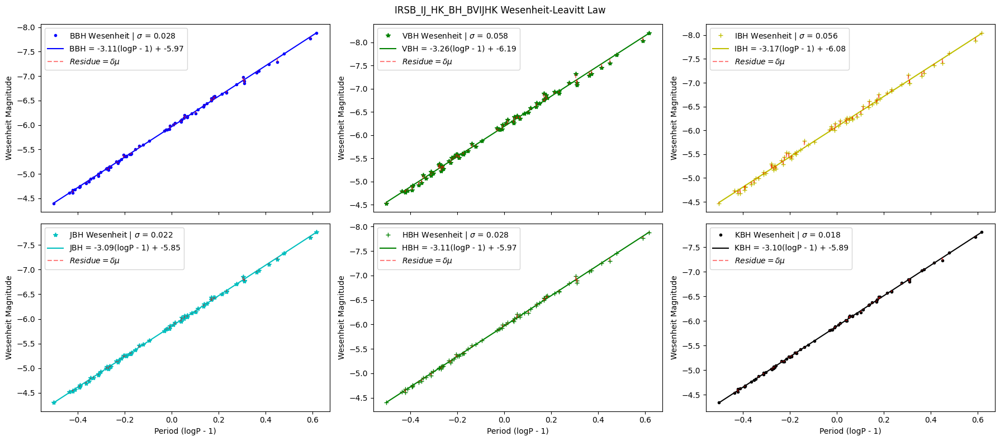

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_BH_j_residuals.pdf


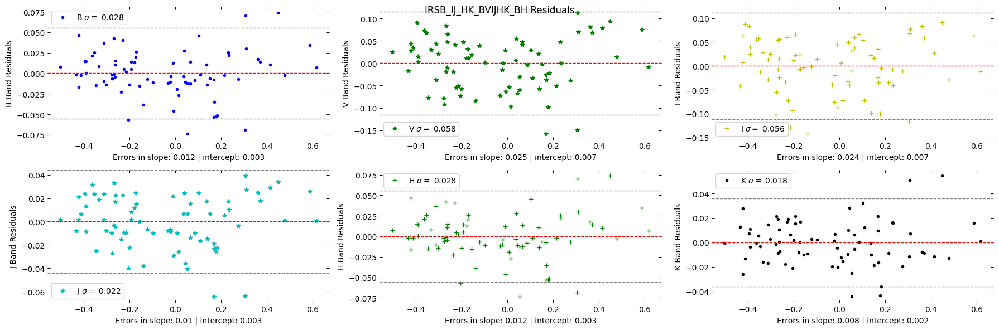

Wesenheit  BK
./docs/plots/2_PLPW/76_IRSB_IJ_HK_BK_BVIJHK_j.pdf


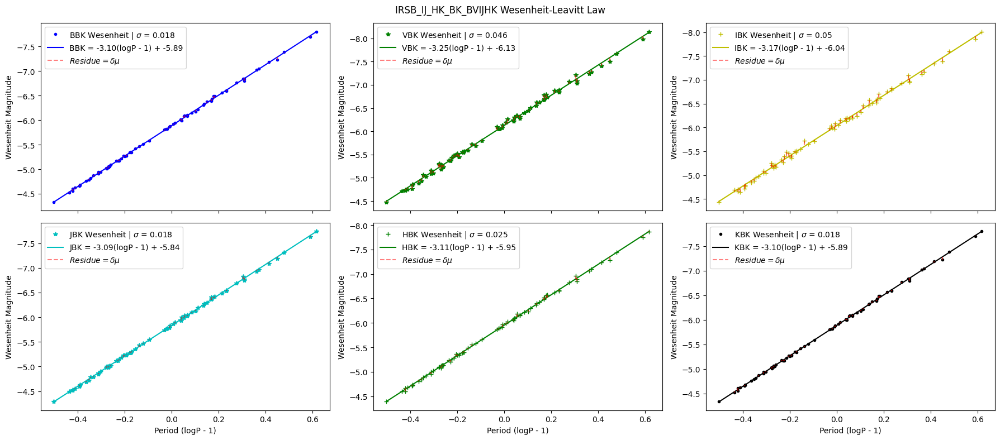

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_BK_j_residuals.pdf


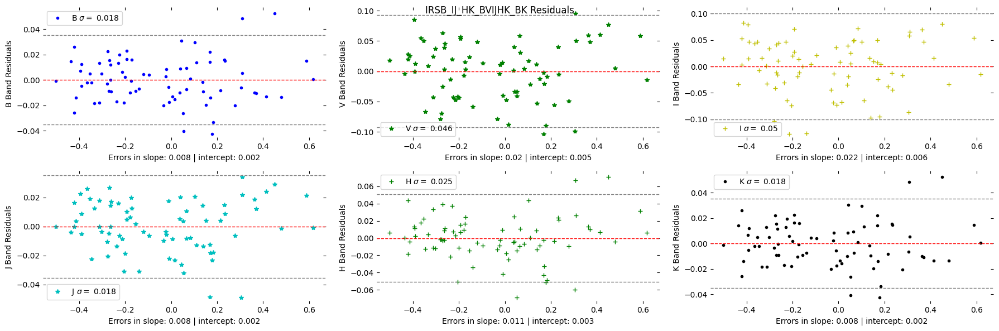

Wesenheit  VI
./docs/plots/2_PLPW/76_IRSB_IJ_HK_VI_BVIJHK_j.pdf


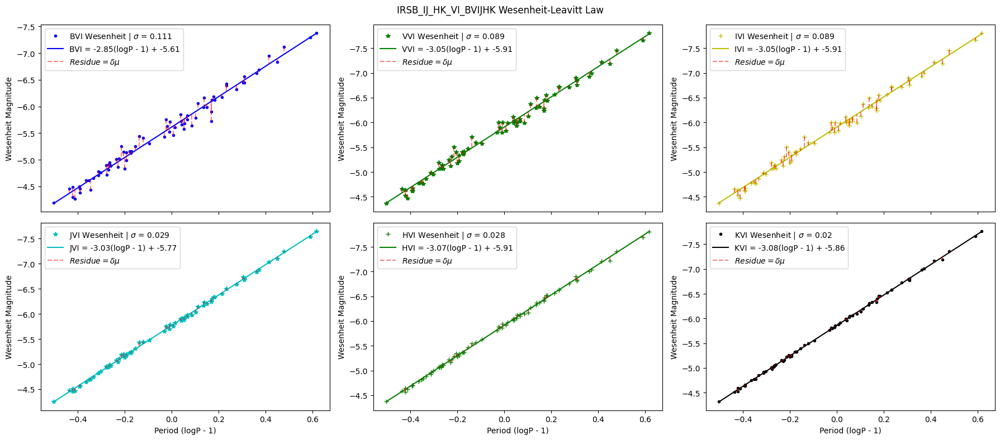

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_VI_j_residuals.pdf


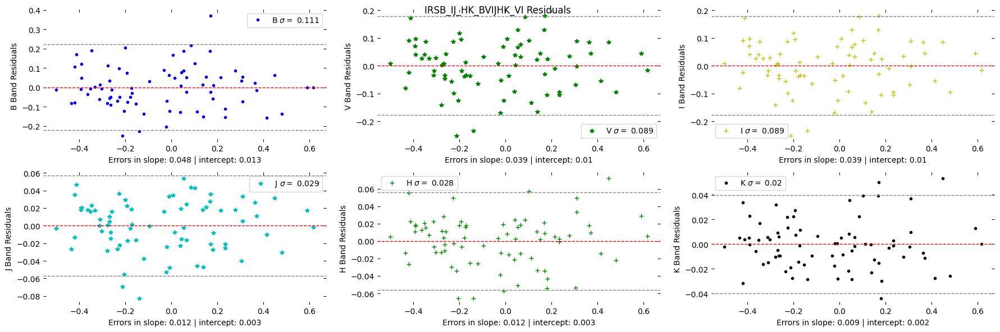

Wesenheit  VJ
./docs/plots/2_PLPW/76_IRSB_IJ_HK_VJ_BVIJHK_j.pdf


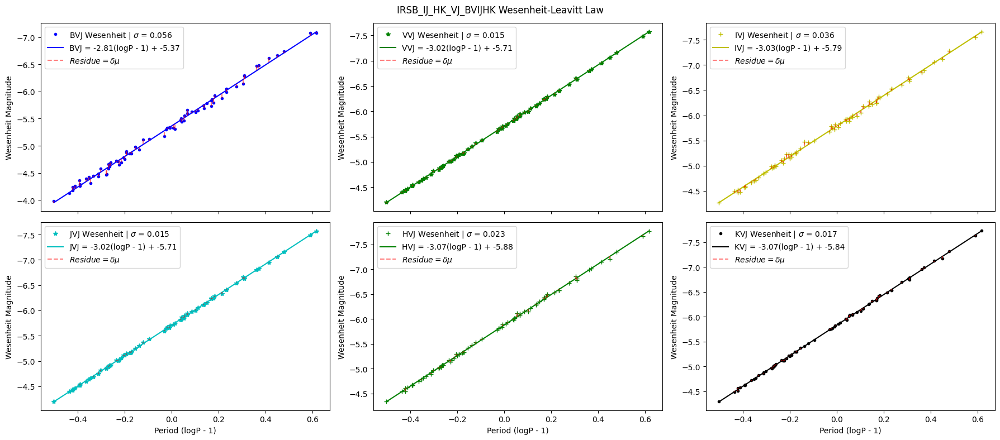

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_VJ_j_residuals.pdf


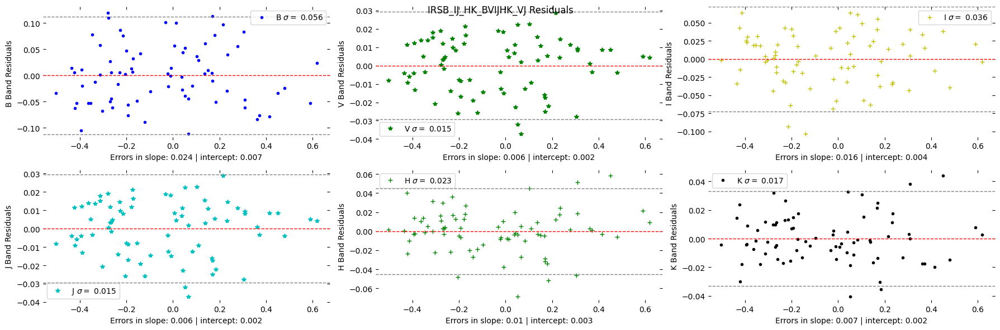

Wesenheit  VH
./docs/plots/2_PLPW/76_IRSB_IJ_HK_VH_BVIJHK_j.pdf


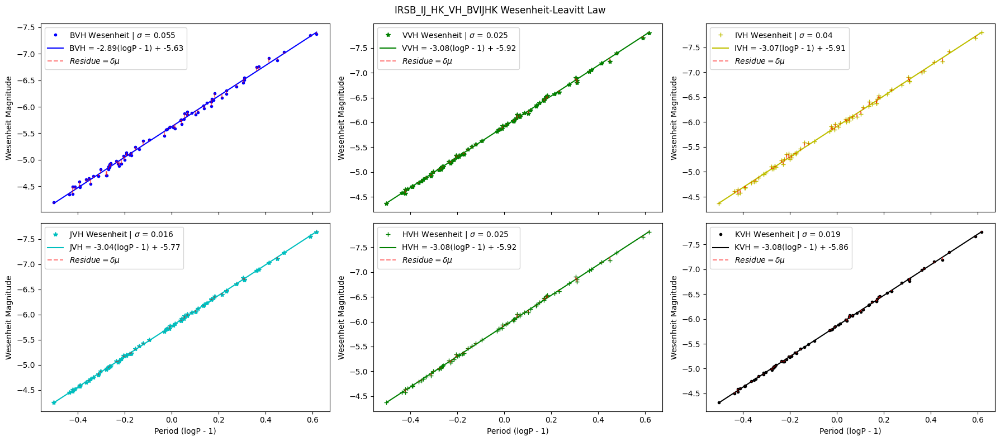

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_VH_j_residuals.pdf


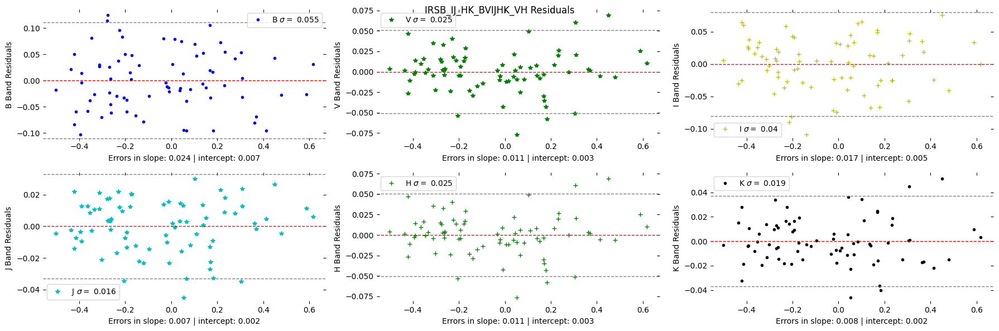

Wesenheit  VK
./docs/plots/2_PLPW/76_IRSB_IJ_HK_VK_BVIJHK_j.pdf


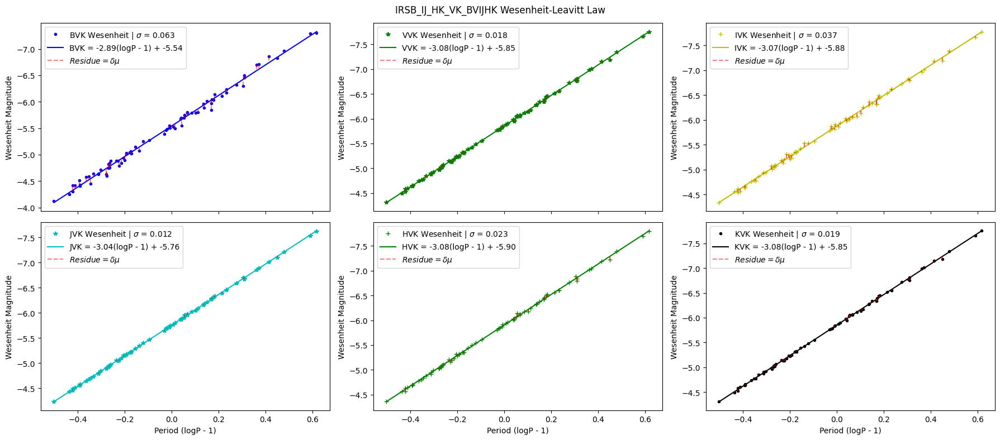

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_VK_j_residuals.pdf


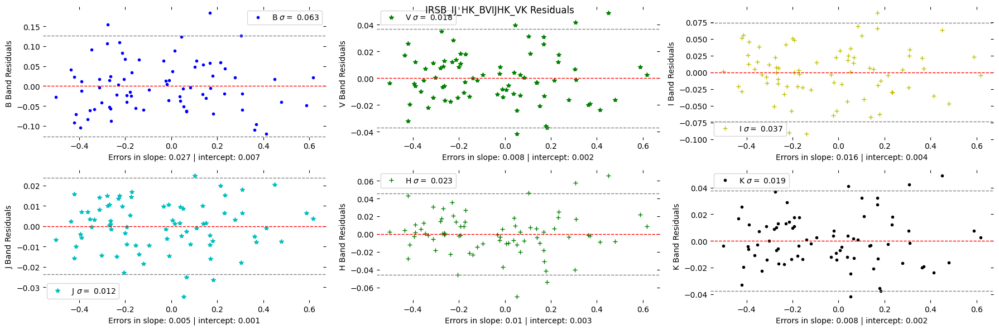

Wesenheit  IJ
./docs/plots/2_PLPW/76_IRSB_IJ_HK_IJ_BVIJHK_j.pdf


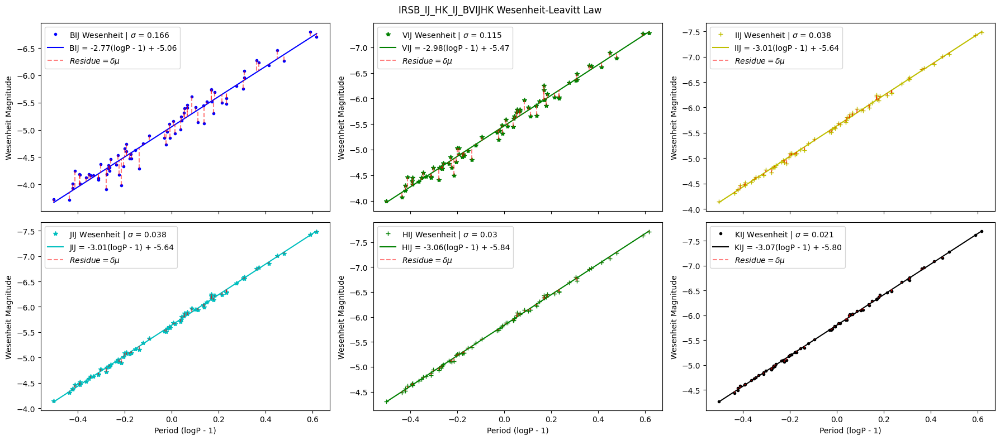

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_IJ_j_residuals.pdf


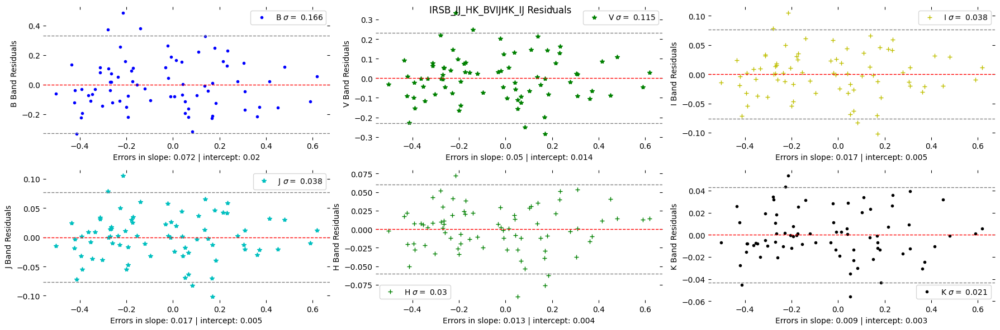

Wesenheit  IH
./docs/plots/2_PLPW/76_IRSB_IJ_HK_IH_BVIJHK_j.pdf


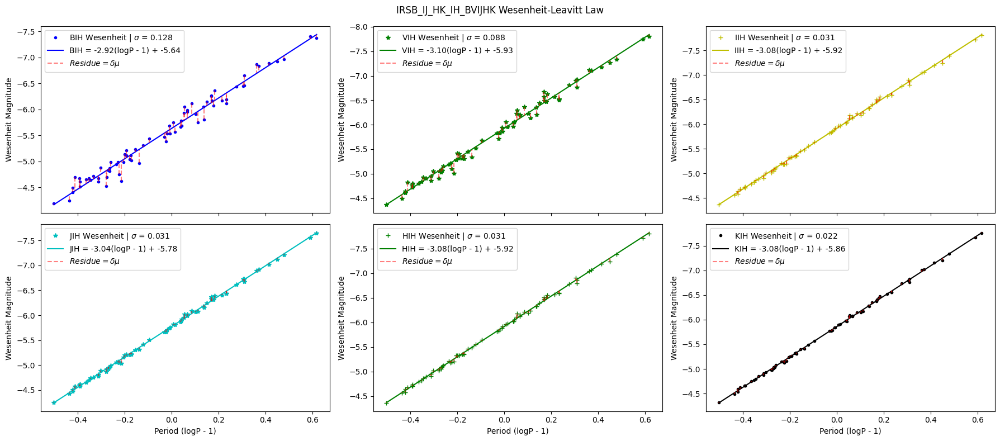

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_IH_j_residuals.pdf


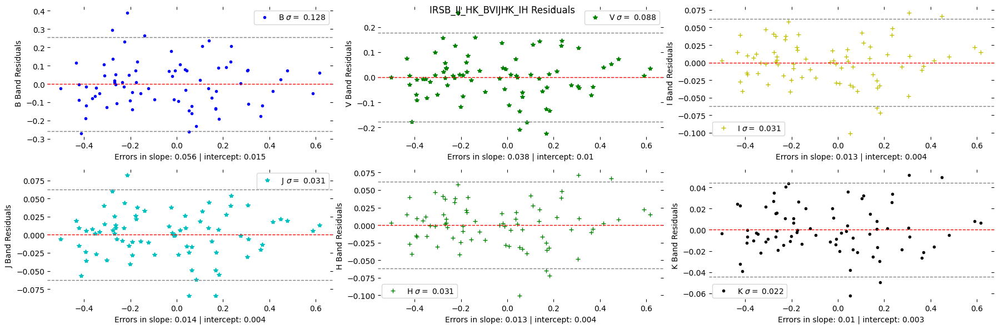

Wesenheit  IK
./docs/plots/2_PLPW/76_IRSB_IJ_HK_IK_BVIJHK_j.pdf


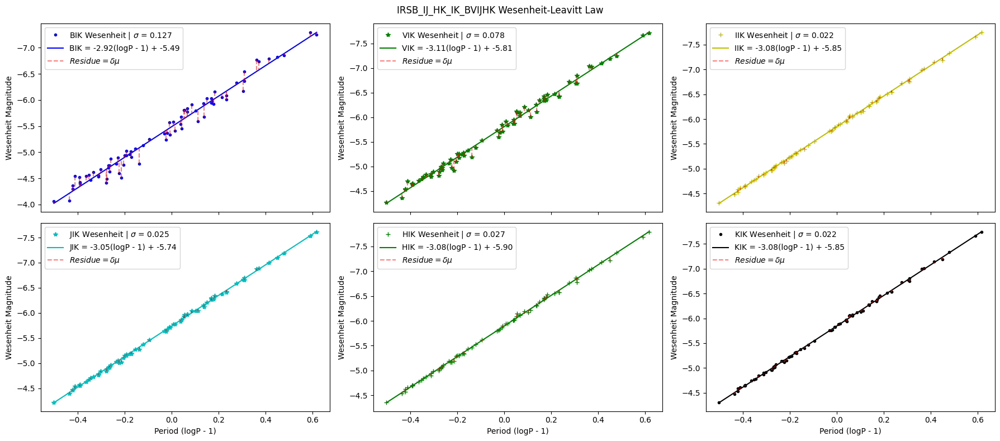

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_IK_j_residuals.pdf


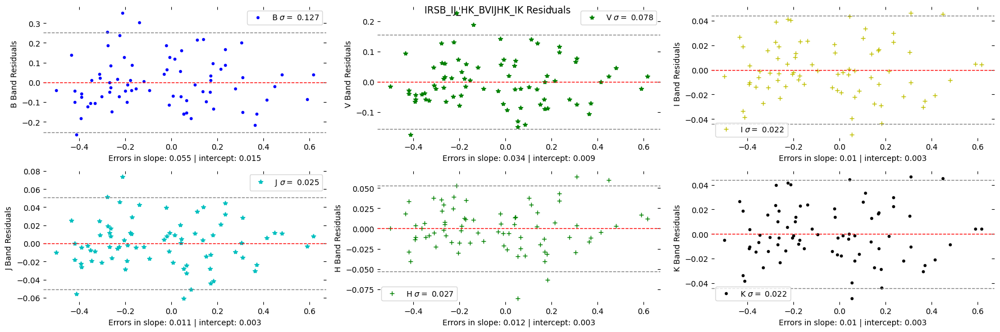

Wesenheit  JH
./docs/plots/2_PLPW/76_IRSB_IJ_HK_JH_BVIJHK_j.pdf


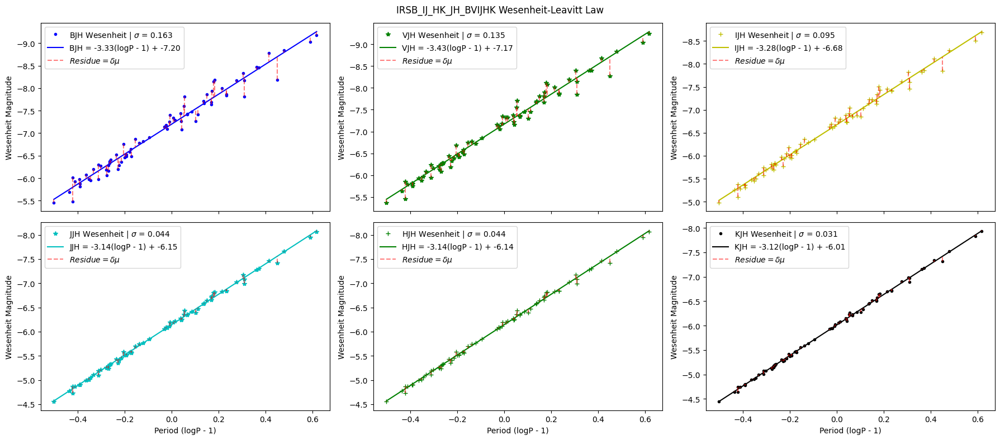

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_JH_j_residuals.pdf


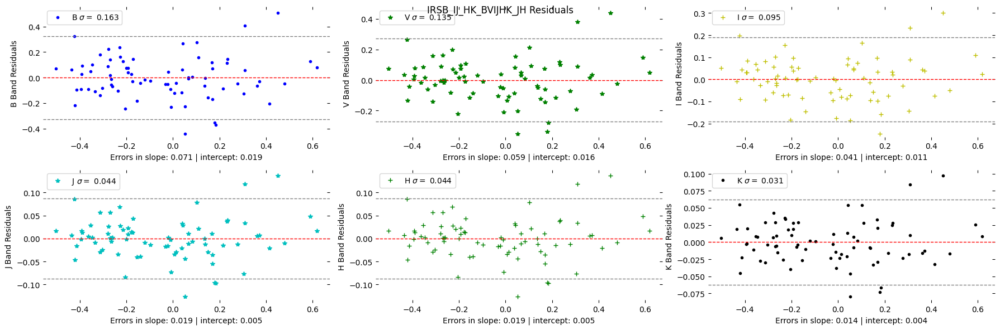

Wesenheit  JK
./docs/plots/2_PLPW/76_IRSB_IJ_HK_JK_BVIJHK_j.pdf


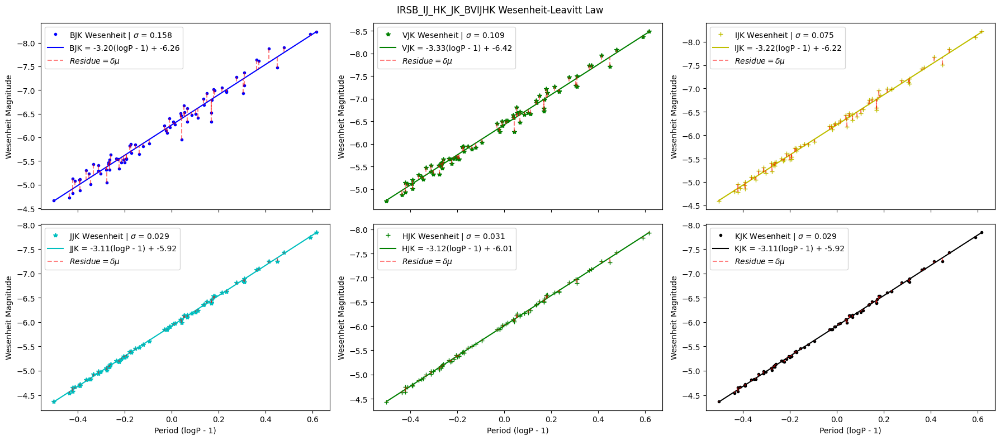

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_JK_j_residuals.pdf


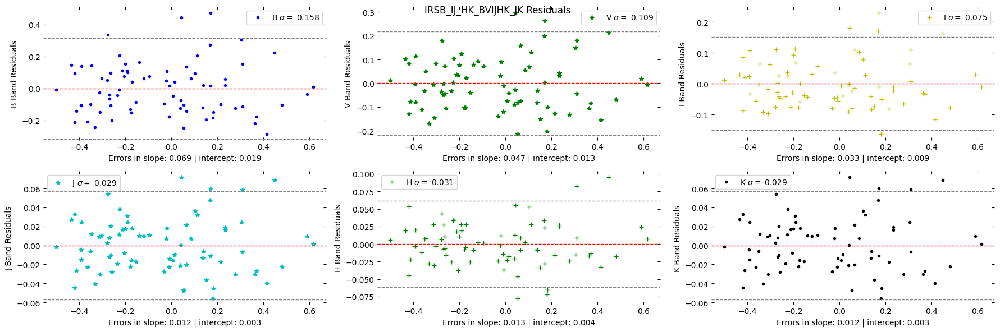

Wesenheit  HK
./docs/plots/2_PLPW/76_IRSB_IJ_HK_HK_BVIJHK_j.pdf


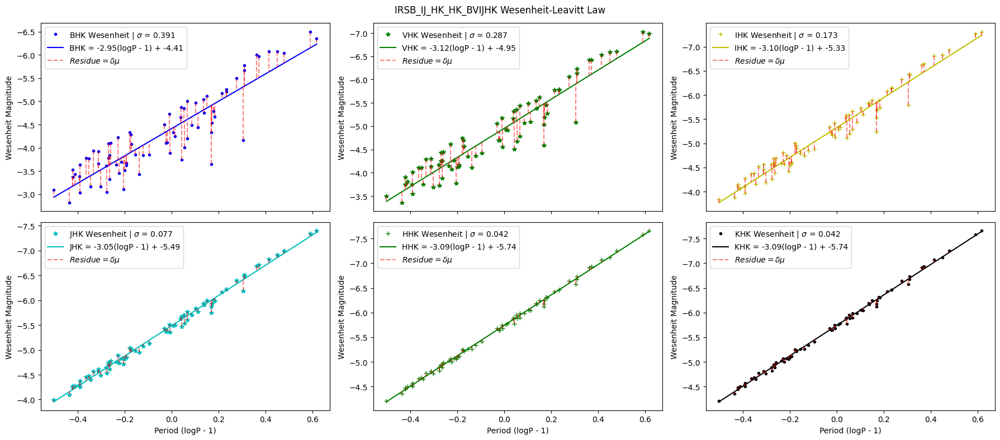

./docs/plots/2_PLPW/76_IRSB_IJ_HK_BVIJHK_HK_j_residuals.pdf


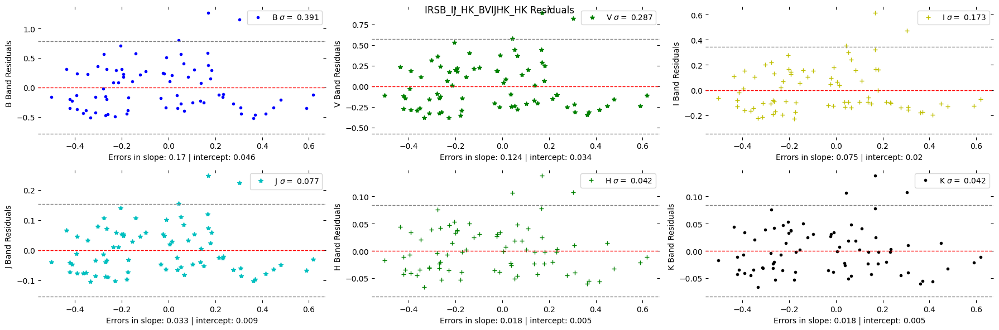

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [6]:
[plotPW6(merged_data, PLWregression, col) for col in wes_show]

# Residue - Residue Plot

* * d_del_del module loaded!
For Wesenheit:
BV
./docs/plots/3_deldel/76_IRSB_deldel_M_0BV_j.pdf


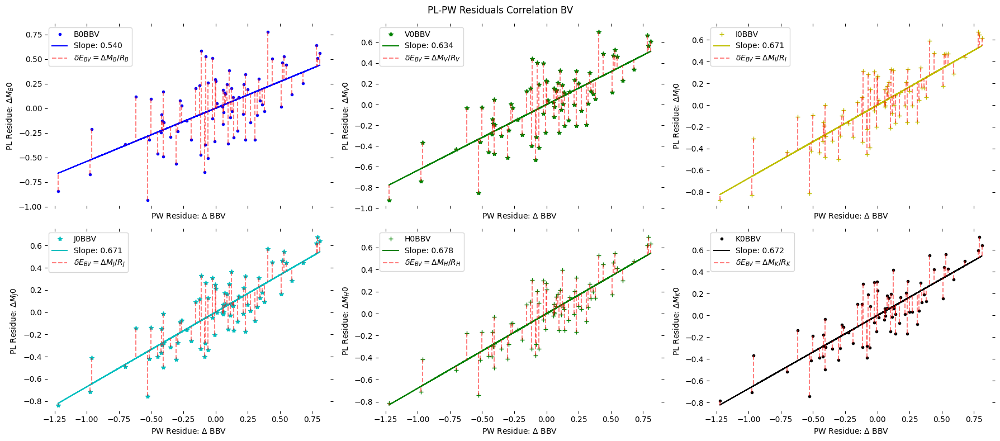

VI
./docs/plots/3_deldel/76_IRSB_deldel_M_0VI_j.pdf


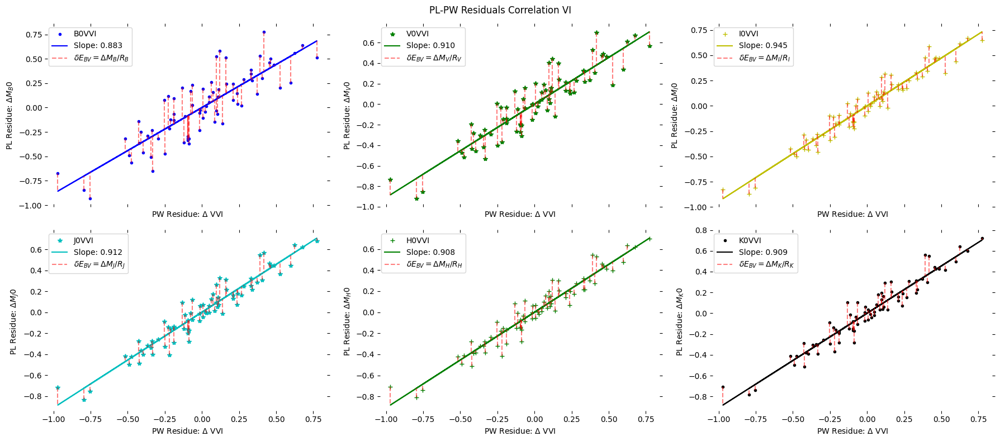

VJ
./docs/plots/3_deldel/76_IRSB_deldel_M_0VJ_j.pdf


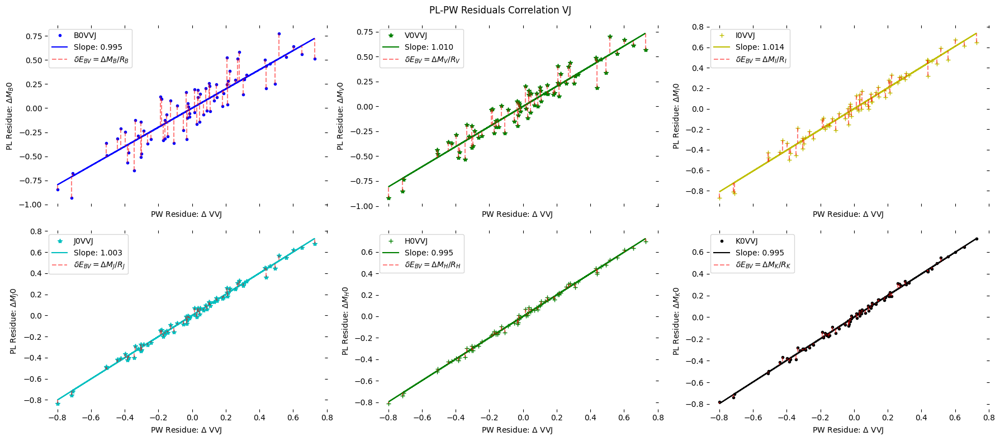

VK
./docs/plots/3_deldel/76_IRSB_deldel_M_0VK_j.pdf


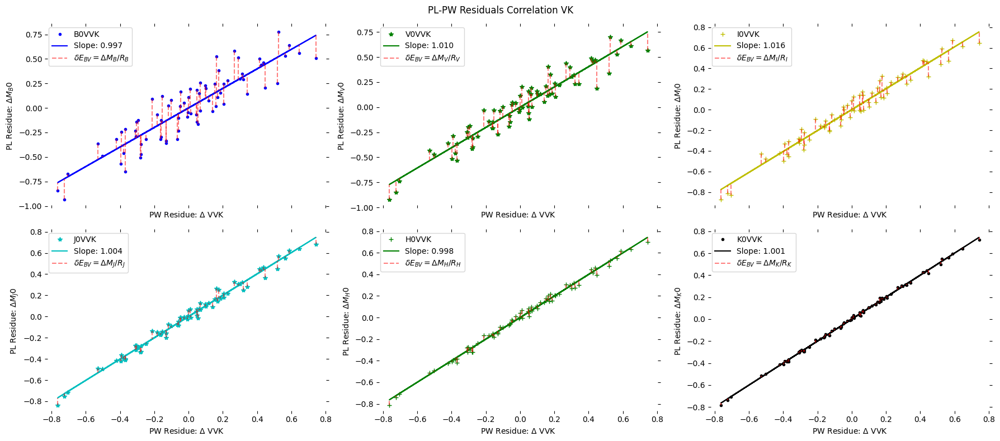

IJ
./docs/plots/3_deldel/76_IRSB_deldel_M_0IJ_j.pdf


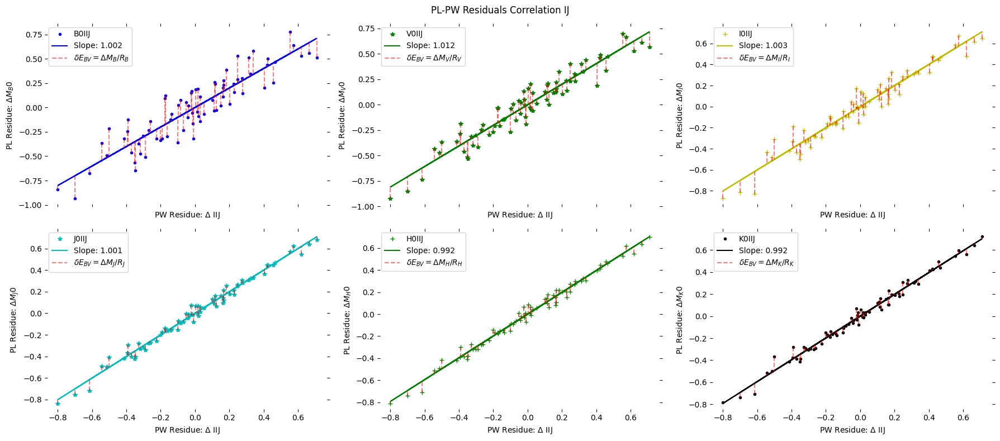

IH
./docs/plots/3_deldel/76_IRSB_deldel_M_0IH_j.pdf


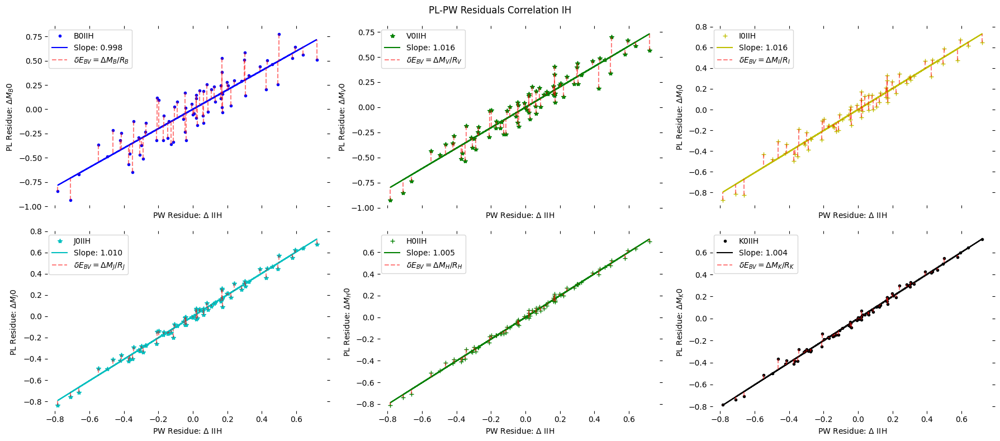

IK
./docs/plots/3_deldel/76_IRSB_deldel_M_0IK_j.pdf


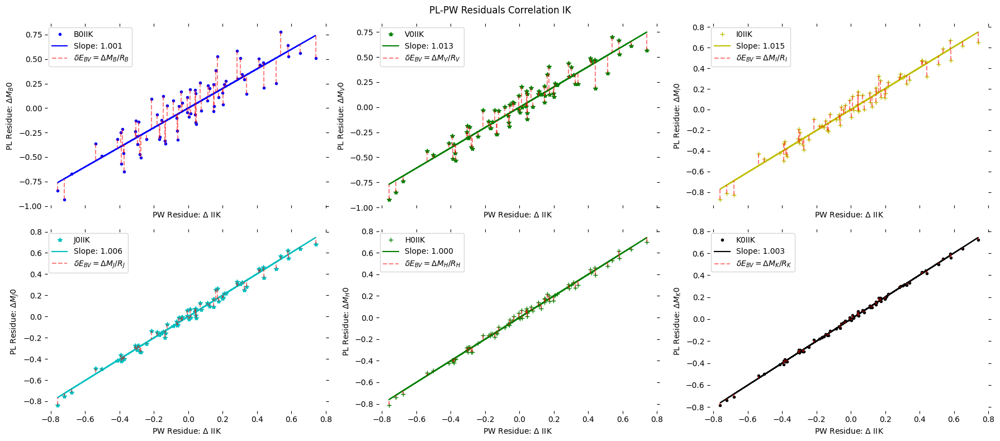

JK
./docs/plots/3_deldel/76_IRSB_deldel_M_0JK_j.pdf


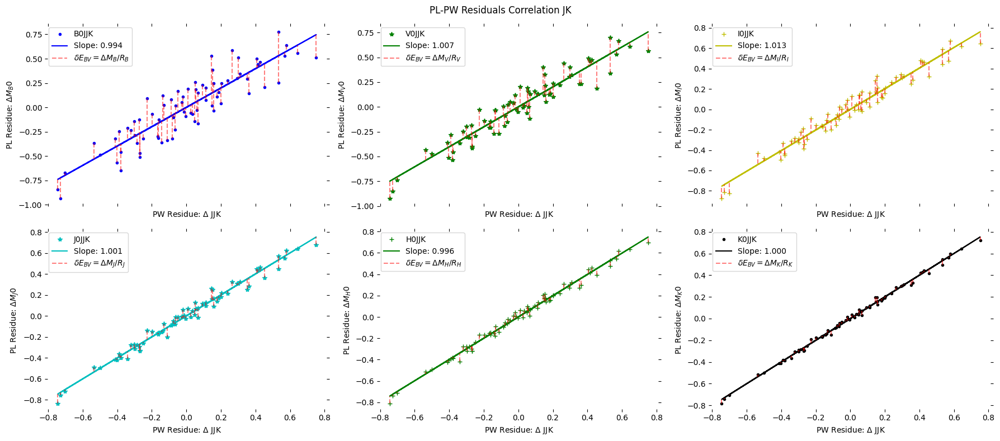

JH
./docs/plots/3_deldel/76_IRSB_deldel_M_0JH_j.pdf


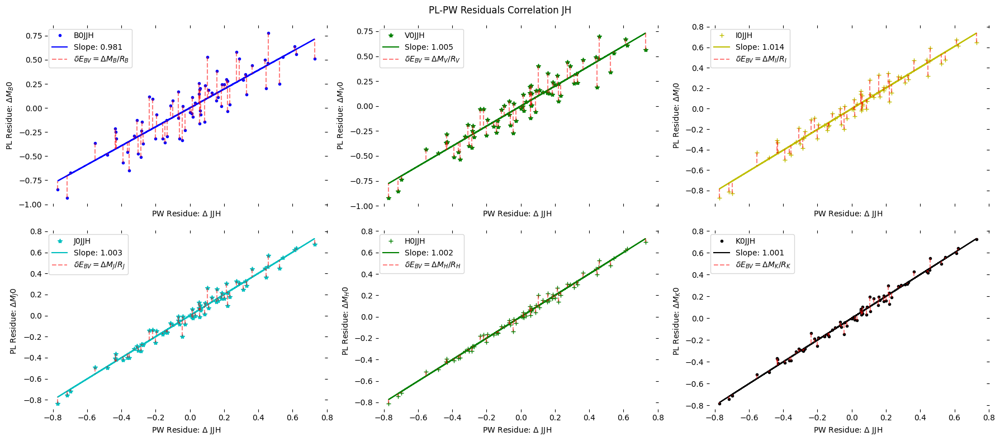

HK
./docs/plots/3_deldel/76_IRSB_deldel_M_0HK_j.pdf


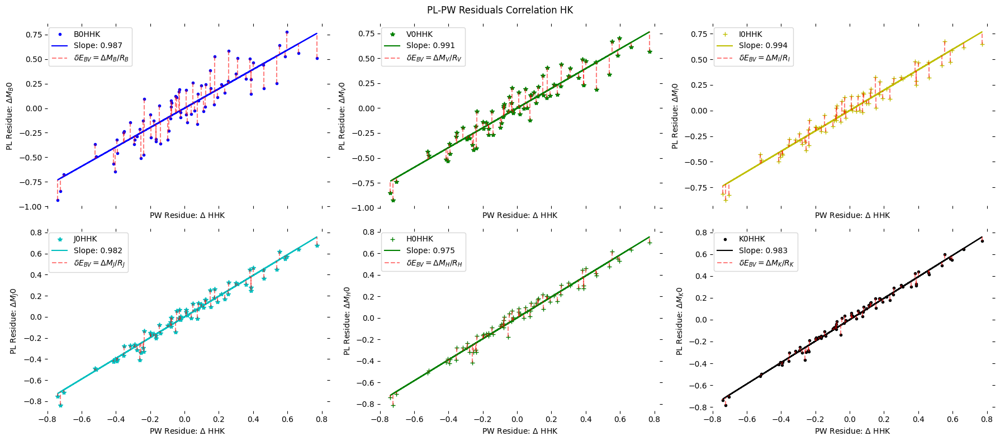

[None, None, None, None, None, None, None, None, None, None]

In [2]:
from lvtlaw.d_del_del import plotdeldel6
from lvtlaw.h_loadoutput import *
dmc, dpre, dres, merged_data = residual_correlation_() #2
print(f'For Wesenheit:')
dd = ['BV','VI','VJ','VK','IJ','IH','IK', 'JK', 'JH', 'HK']
[plotdeldel6(merged_data, dmc, col, dis, 'M', '0', s) for col in dd]

In [11]:
merged_data[merged_data[f'r_BHK{dis_flag[0]}']>1.5]

,Unnamed: 0,name,logP,EBV,IRSB,M_B_j,M_V_j,M_I_j,M_J_j,M_H_j,...,p_I0IJK_j,p_J0JJK_j,p_H0HJK_j,p_K0KJK_j,p_B0BHK_j,p_V0VHK_j,p_I0IHK_j,p_J0JHK_j,p_H0HHK_j,p_K0KHK_j
35,35,CK Sct,0.870124,0.757,10.626,1.539,-0.051,-1.848,-3.128,-3.806,...,0.954766,0.935106,0.902539,0.933717,0.961728,0.928555,1.011316,1.012402,0.967456,0.978032


* * datamapping module loaded!
* * a_utils module loaded!
* * datamapping module loaded!
* * b_data_transform module loaded!
* * c_pl_pw module loaded!
* * e_error_estimation module loaded!
./docs/plots/4_reddening/94_jesper_2_BV_0SM.pdf


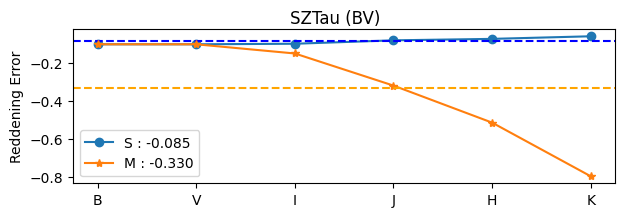

./docs/plots/4_reddening/94_jesper_2_BI_0SM.pdf


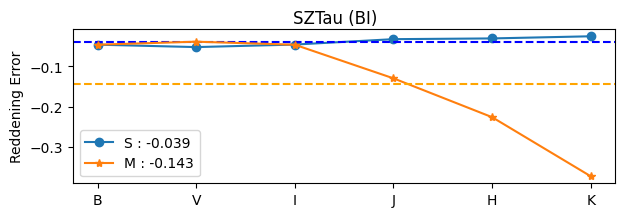

./docs/plots/4_reddening/94_jesper_2_BJ_0SM.pdf


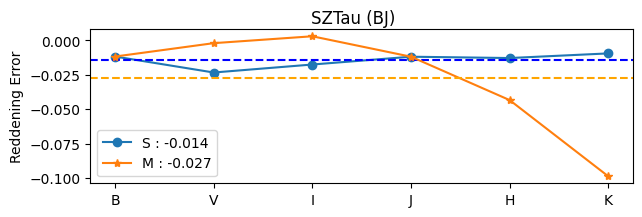

./docs/plots/4_reddening/94_jesper_2_BH_0SM.pdf


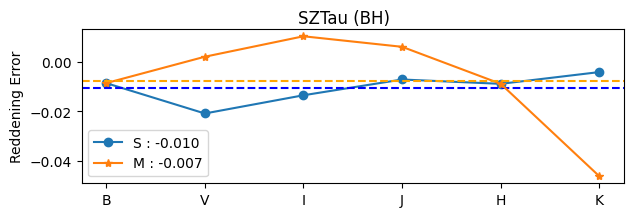

./docs/plots/4_reddening/94_jesper_2_BK_0SM.pdf


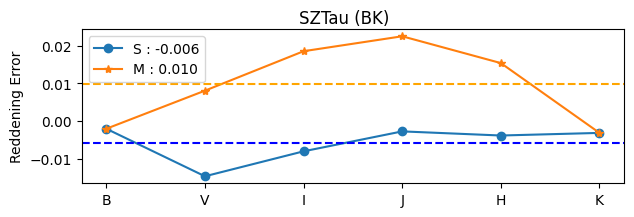

./docs/plots/4_reddening/94_jesper_2_VI_0SM.pdf


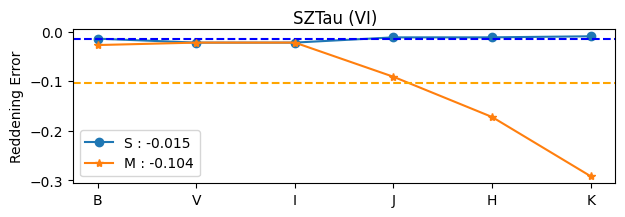

./docs/plots/4_reddening/94_jesper_2_VJ_0SM.pdf


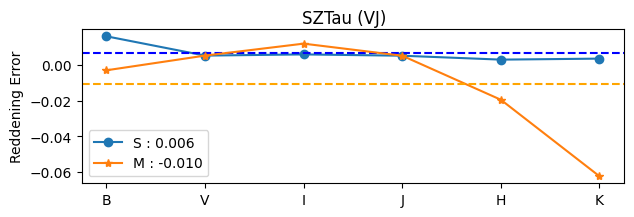

./docs/plots/4_reddening/94_jesper_2_VH_0SM.pdf


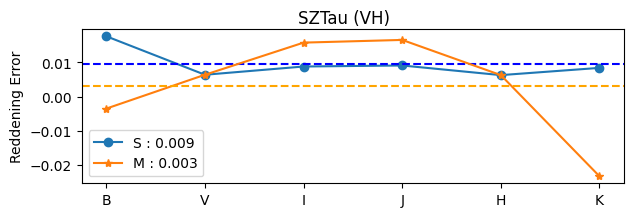

./docs/plots/4_reddening/94_jesper_2_VK_0SM.pdf


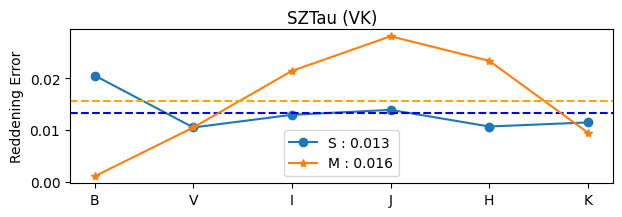

./docs/plots/4_reddening/94_jesper_2_IJ_0SM.pdf


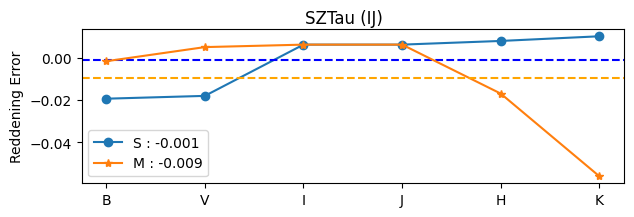

./docs/plots/4_reddening/94_jesper_2_IH_0SM.pdf


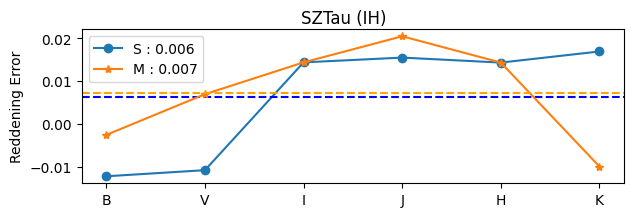

./docs/plots/4_reddening/94_jesper_2_IK_0SM.pdf


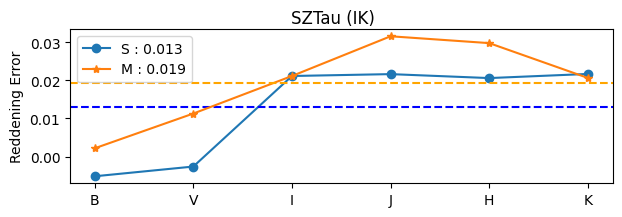

./docs/plots/4_reddening/94_jesper_2_JH_0SM.pdf


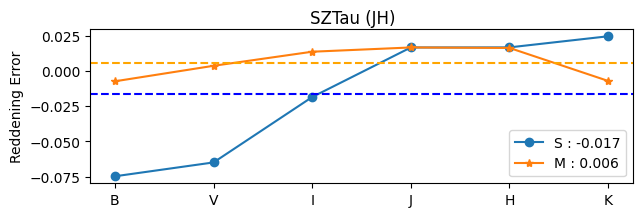

./docs/plots/4_reddening/94_jesper_2_JK_0SM.pdf


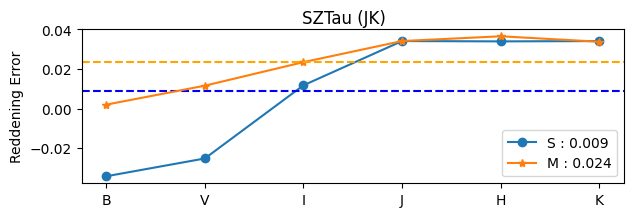

./docs/plots/4_reddening/94_jesper_2_HK_0SM.pdf


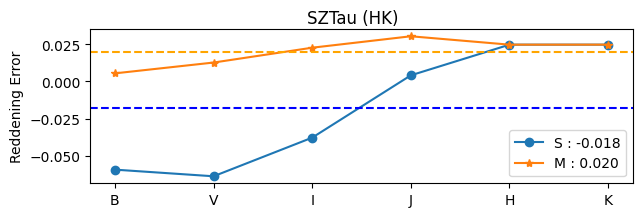

./docs/plots/4_reddening/94_jesper_3_BV_0SM.pdf


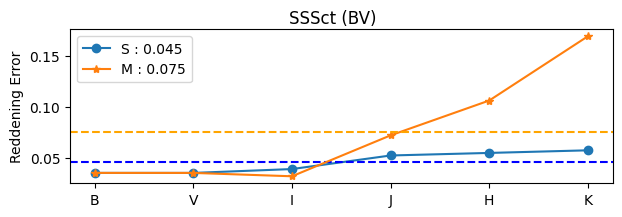

./docs/plots/4_reddening/94_jesper_3_BI_0SM.pdf


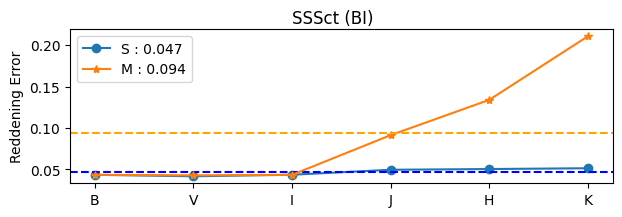

./docs/plots/4_reddening/94_jesper_3_BJ_0SM.pdf


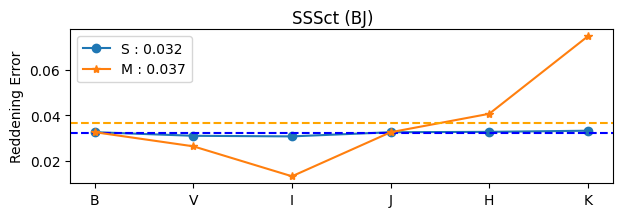

./docs/plots/4_reddening/94_jesper_3_BH_0SM.pdf


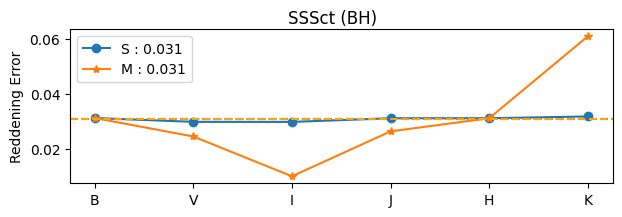

./docs/plots/4_reddening/94_jesper_3_BK_0SM.pdf


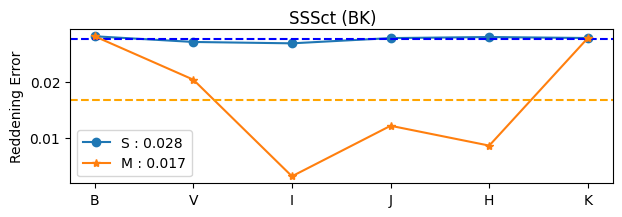

./docs/plots/4_reddening/94_jesper_3_VI_0SM.pdf


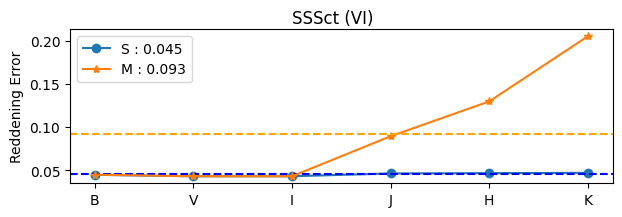

./docs/plots/4_reddening/94_jesper_3_VJ_0SM.pdf


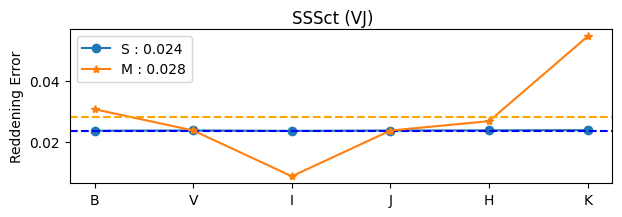

./docs/plots/4_reddening/94_jesper_3_VH_0SM.pdf


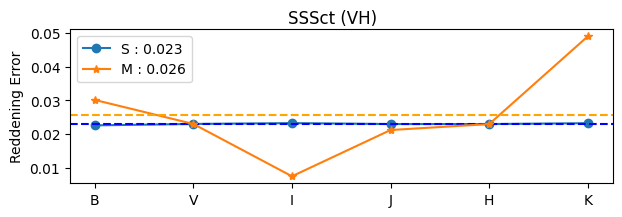

./docs/plots/4_reddening/94_jesper_3_VK_0SM.pdf


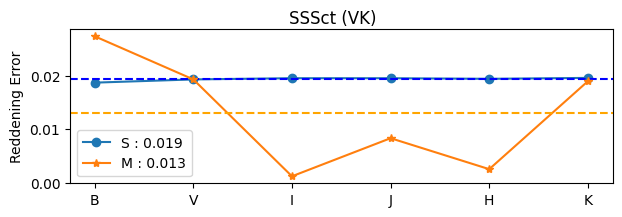

./docs/plots/4_reddening/94_jesper_3_IJ_0SM.pdf


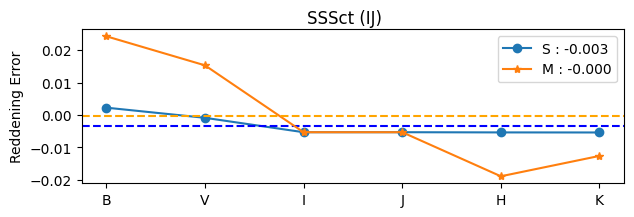

./docs/plots/4_reddening/94_jesper_3_IH_0SM.pdf


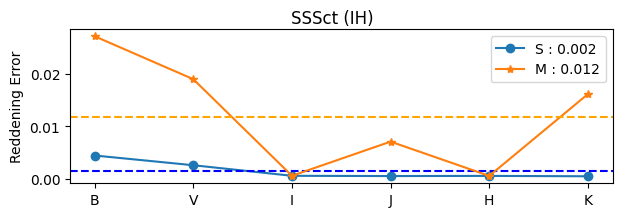

./docs/plots/4_reddening/94_jesper_3_IK_0SM.pdf


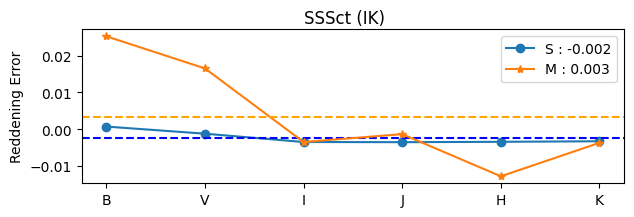

./docs/plots/4_reddening/94_jesper_3_JH_0SM.pdf


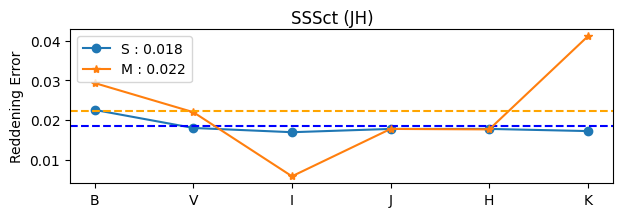

./docs/plots/4_reddening/94_jesper_3_JK_0SM.pdf


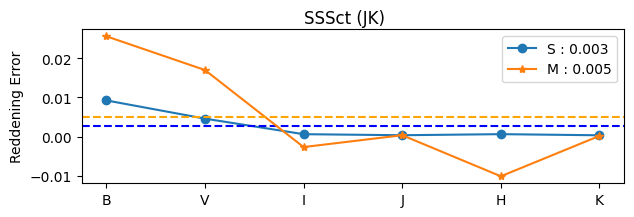

./docs/plots/4_reddening/94_jesper_3_HK_0SM.pdf


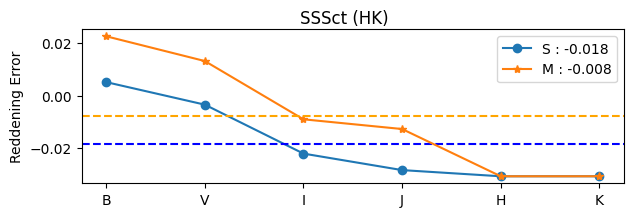

./docs/plots/4_reddening/94_jesper_4_BV_0SM.pdf


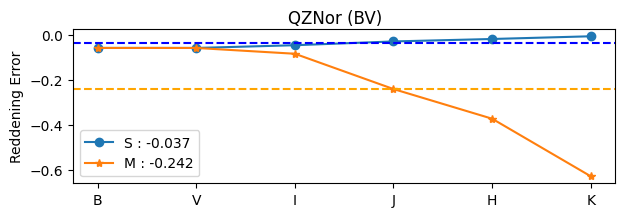

./docs/plots/4_reddening/94_jesper_4_BI_0SM.pdf


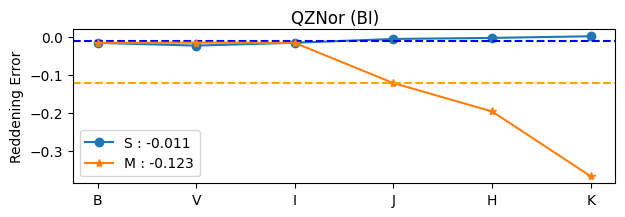

./docs/plots/4_reddening/94_jesper_4_BJ_0SM.pdf


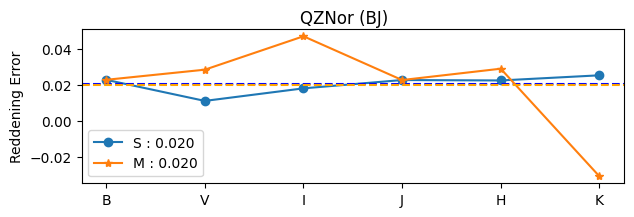

./docs/plots/4_reddening/94_jesper_4_BH_0SM.pdf


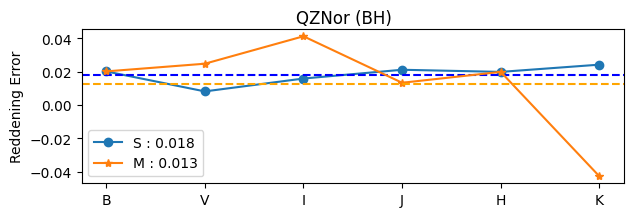

./docs/plots/4_reddening/94_jesper_4_BK_0SM.pdf


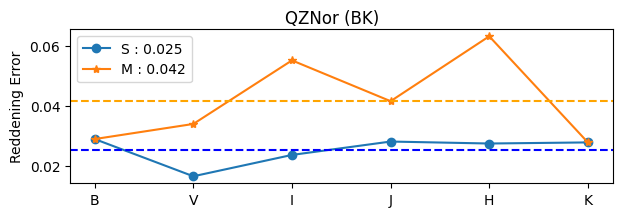

./docs/plots/4_reddening/94_jesper_4_VI_0SM.pdf


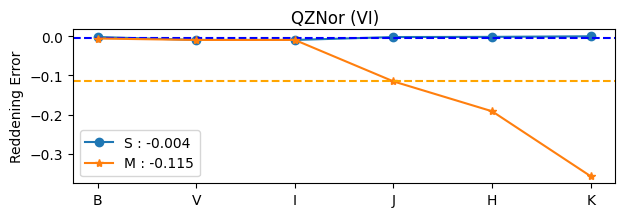

./docs/plots/4_reddening/94_jesper_4_VJ_0SM.pdf


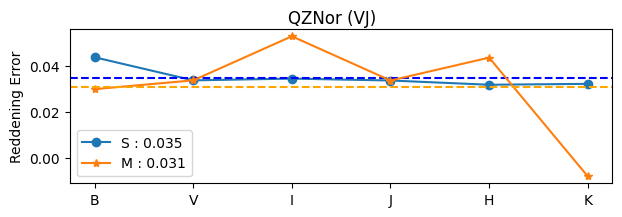

./docs/plots/4_reddening/94_jesper_4_VH_0SM.pdf


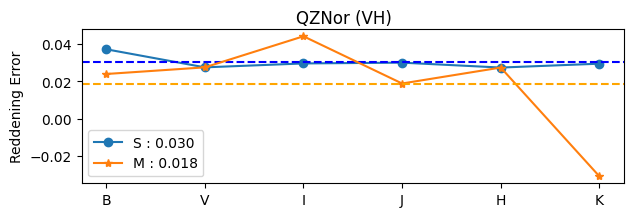

./docs/plots/4_reddening/94_jesper_4_VK_0SM.pdf


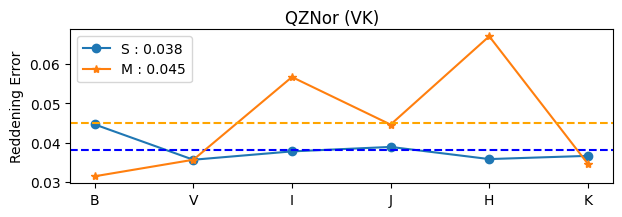

./docs/plots/4_reddening/94_jesper_4_IJ_0SM.pdf


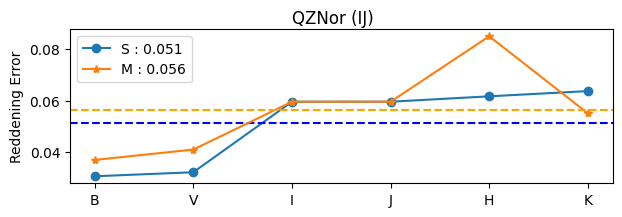

./docs/plots/4_reddening/94_jesper_4_IH_0SM.pdf


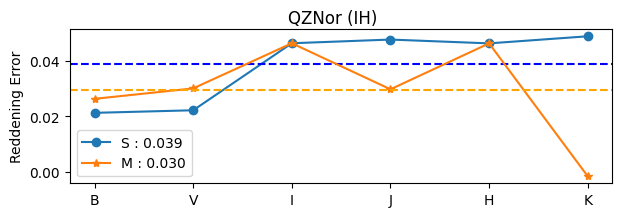

./docs/plots/4_reddening/94_jesper_4_IK_0SM.pdf


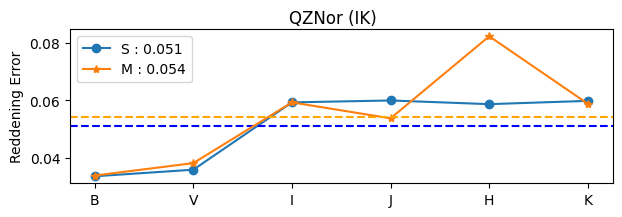

./docs/plots/4_reddening/94_jesper_4_JH_0SM.pdf


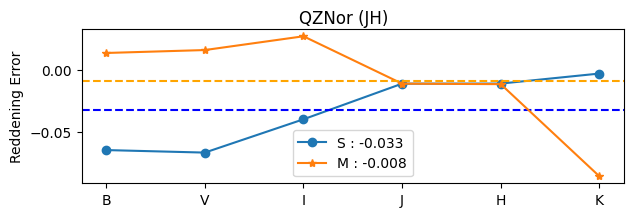

./docs/plots/4_reddening/94_jesper_4_JK_0SM.pdf


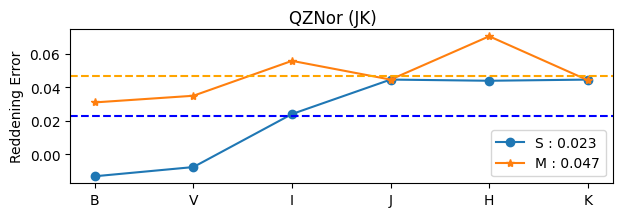

./docs/plots/4_reddening/94_jesper_4_HK_0SM.pdf


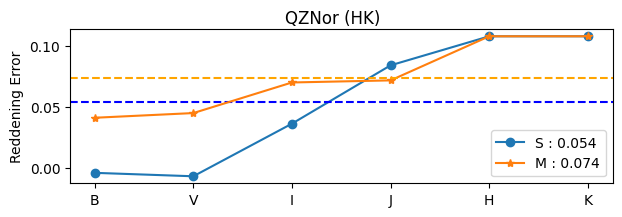

./docs/plots/4_reddening/94_jesper_5_BV_0SM.pdf


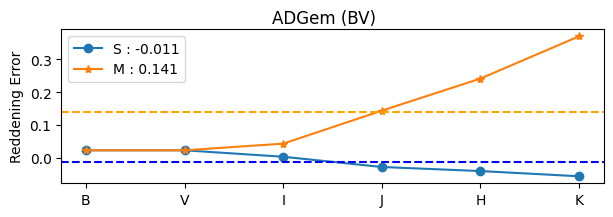

./docs/plots/4_reddening/94_jesper_5_BI_0SM.pdf


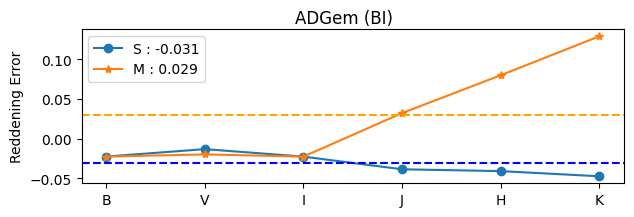

./docs/plots/4_reddening/94_jesper_5_BJ_0SM.pdf


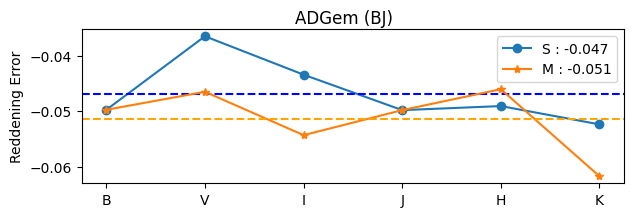

./docs/plots/4_reddening/94_jesper_5_BH_0SM.pdf


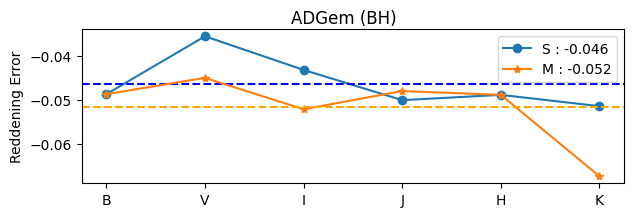

./docs/plots/4_reddening/94_jesper_5_BK_0SM.pdf


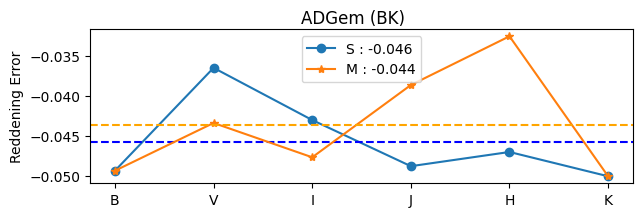

./docs/plots/4_reddening/94_jesper_5_VI_0SM.pdf


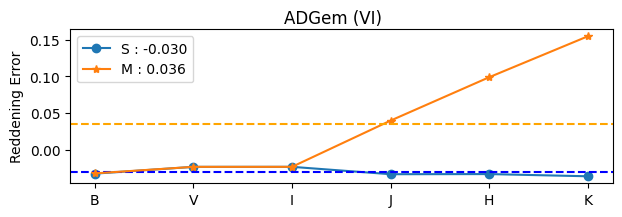

./docs/plots/4_reddening/94_jesper_5_VJ_0SM.pdf


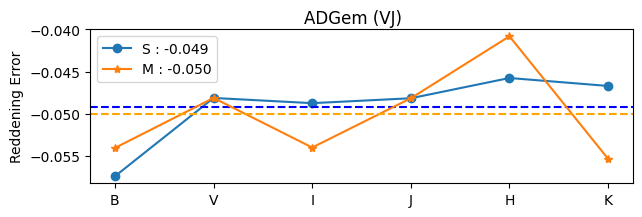

./docs/plots/4_reddening/94_jesper_5_VH_0SM.pdf


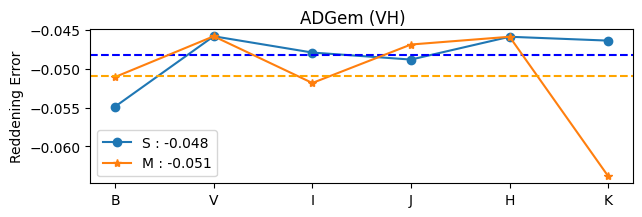

./docs/plots/4_reddening/94_jesper_5_VK_0SM.pdf


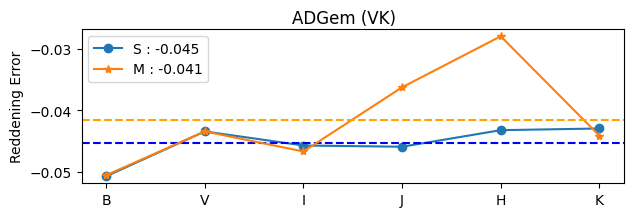

./docs/plots/4_reddening/94_jesper_5_IJ_0SM.pdf


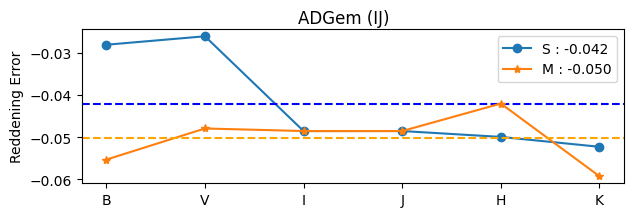

./docs/plots/4_reddening/94_jesper_5_IH_0SM.pdf


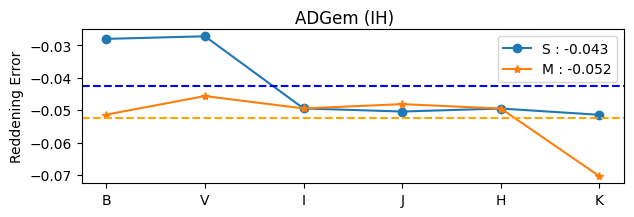

./docs/plots/4_reddening/94_jesper_5_IK_0SM.pdf


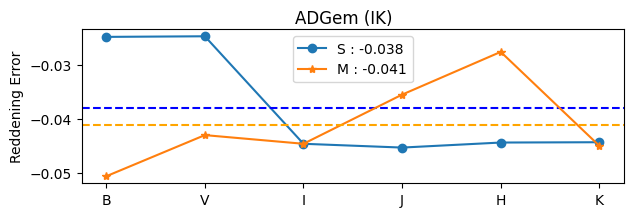

./docs/plots/4_reddening/94_jesper_5_JH_0SM.pdf


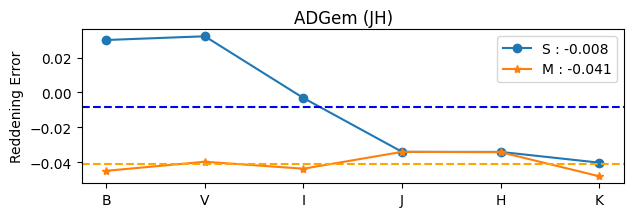

./docs/plots/4_reddening/94_jesper_5_JK_0SM.pdf


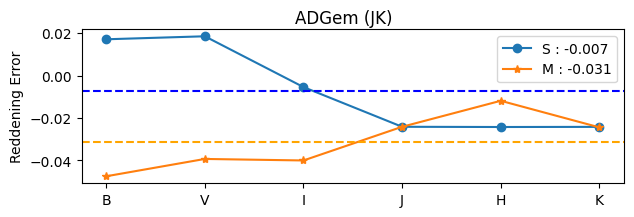

./docs/plots/4_reddening/94_jesper_5_HK_0SM.pdf


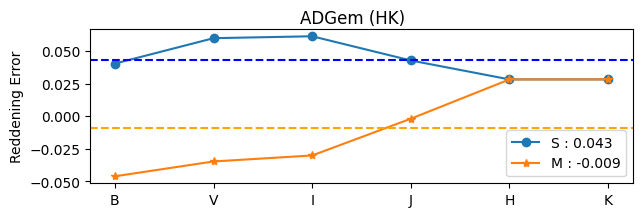

In [1]:
from data.datamapping import colors, mag
cols = colors(mag)
from lvtlaw.h_loadoutput import *
from lvtlaw.e_error_estimation import plot_star_rd0, plot_star_rd0SM
ext0, red0, mu_df_list_dict, data = rd_mu_error_matrix_()    
for i in range(2,6):
    for col in cols:
        plot_star_rd0SM(i, red0, col, '0')
    #plot_star_rd0SM(i, red0, 'VI', '0')
    #plot_star_rd0SM(i, red0, 'VK', '0')
    #plot_star_rd0SM(i, red0, 'JK', '0')
    

# Decoupling Distance Reddening Systematic Errors

* * datamapping module loaded!
* * a_utils module loaded!
* * f_star_wise module loaded!
* * datamapping module loaded!
76_IRSB_44_star_MBV_j
./docs/plots/6_rms/76_IRSB_44_star_MBV_j.pdf


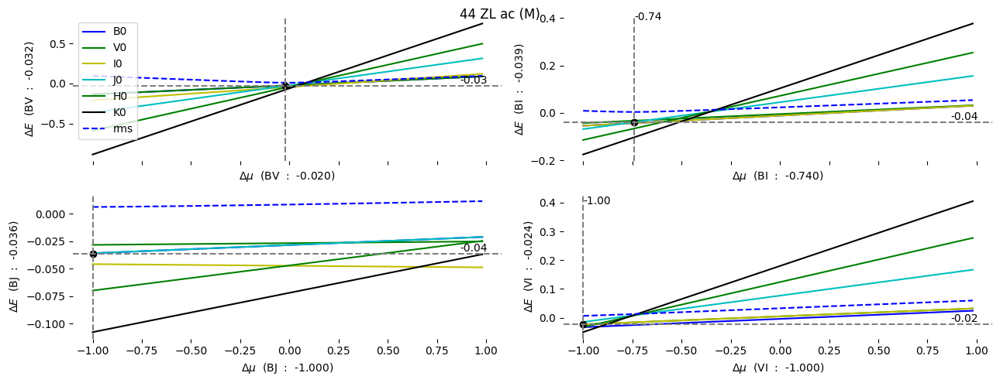

76_IRSB_44_star_MIJ_j
./docs/plots/6_rms/76_IRSB_44_star_MIJ_j.pdf


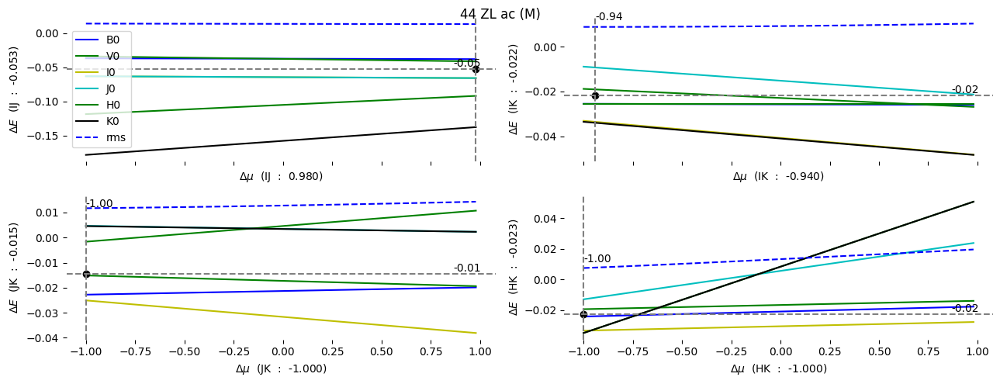

76_IRSB_37_star_MBV_j
./docs/plots/6_rms/76_IRSB_37_star_MBV_j.pdf


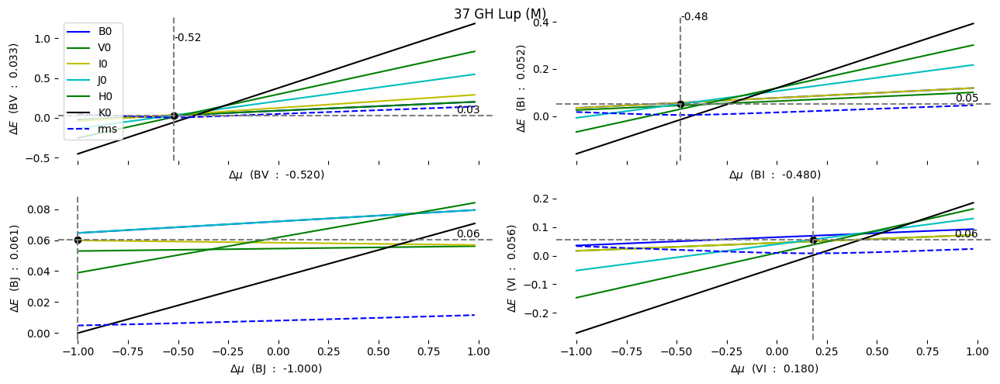

76_IRSB_37_star_MIJ_j
./docs/plots/6_rms/76_IRSB_37_star_MIJ_j.pdf


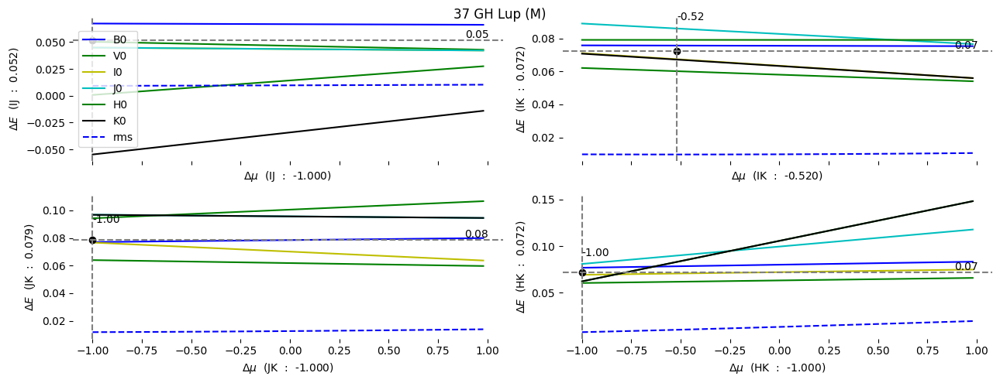

76_IRSB_5_star_MBV_j
./docs/plots/6_rms/76_IRSB_5_star_MBV_j.pdf


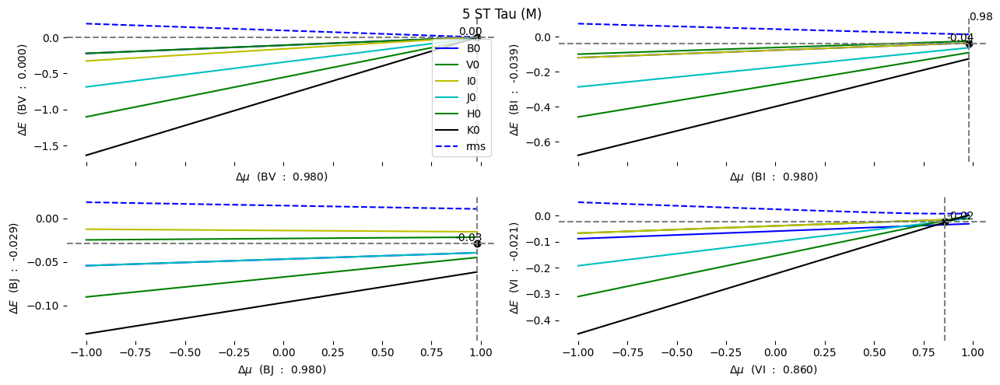

76_IRSB_5_star_MIJ_j
./docs/plots/6_rms/76_IRSB_5_star_MIJ_j.pdf


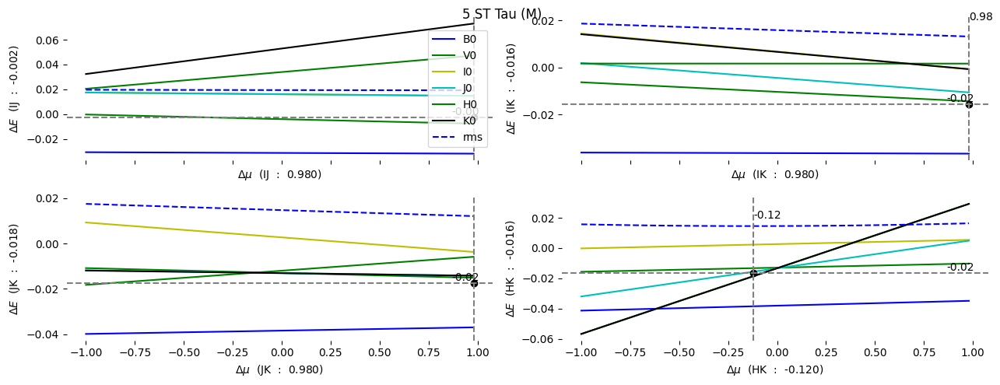

76_IRSB_30_star_MBV_j
./docs/plots/6_rms/76_IRSB_30_star_MBV_j.pdf


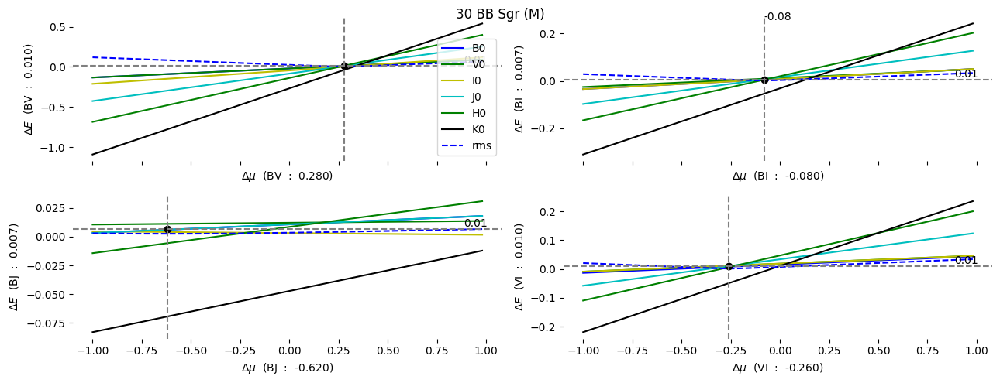

76_IRSB_30_star_MIJ_j
./docs/plots/6_rms/76_IRSB_30_star_MIJ_j.pdf


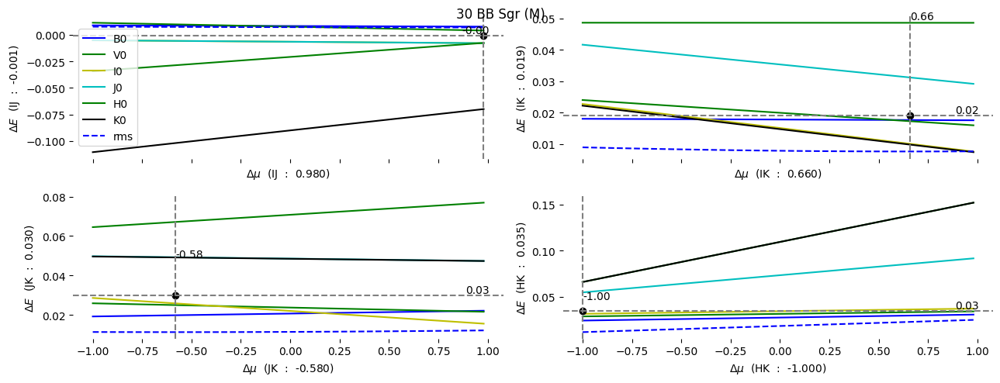

In [1]:
from lvtlaw.f_star_wise import plot_star_rd_mu
from lvtlaw.h_loadoutput import *
stars_list, stars_ex_red_mu_list, correction, data = starwise_analysis_()
four_stars = [44,37,5,30]#[5,9,25,26]
A = ['BV', 'BI', 'BJ', 'VI']
B = ['IJ','IK', 'JK', 'HK']
wes_show = A+B
for i in four_stars:
    plot_star_rd_mu(i, stars_ex_red_mu_list, correction, 'M', '0', dis_flag[0], wes_show[:4],1)
    plot_star_rd_mu(i, stars_ex_red_mu_list, correction, 'M', '0', dis_flag[0], wes_show[4:8],1)
    #plot_star_rd_mu(i, stars_ex_red_mu_list, correction, 'S', '0', dis_flag[0], wes_show[8:12],1)
    #plot_star_rd_mu(i, stars_ex_red_mu_list, correction, 'S', '0', dis_flag[0], wes_show[12:],1)

94_26_star_SJK_p
./docs/plots/6_rms/94_26_star_SJK_p.pdf


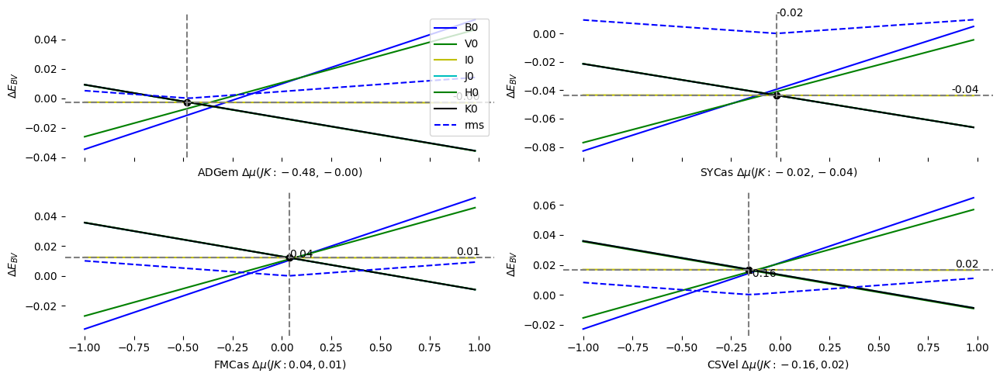

In [3]:
from lvtlaw.f_star_wise import plot_star_rd_mu, plot_star_rd_muM
from lvtlaw.h_loadoutput import *
four_stars = [5,9,25,26]
stars_list, stars_ex_red_mu_list, correction, data = starwise_analysis_()
plot_star_rd_muM(four_stars, stars_ex_red_mu_list, correction, 'S', '0', dis_flag[0], 'JK',1)

In [7]:
stars_ex_red_mu_list[6]

,Unnamed: 0,S0BV_prd_-1.0,S0BV_prd_-0.98,S0BV_prd_-0.96,S0BV_prd_-0.94,S0BV_prd_-0.92,S0BV_prd_-0.9,S0BV_prd_-0.88,S0BV_prd_-0.86,S0BV_prd_-0.84,...,S0HK_prd_0.8,S0HK_prd_0.82,S0HK_prd_0.84,S0HK_prd_0.86,S0HK_prd_0.88,S0HK_prd_0.9,S0HK_prd_0.92,S0HK_prd_0.94,S0HK_prd_0.96,S0HK_prd_0.98
0,B,-0.141915,-0.138816,-0.135717,-0.132617,-0.129518,-0.126419,-0.123320,-0.120220,-0.117121,...,0.031259,0.031843,0.032426,0.033009,0.033592,0.034175,0.034759,0.035342,0.035925,0.036508
1,V,-0.141938,-0.138838,-0.135738,-0.132638,-0.129538,-0.126438,-0.123338,-0.120238,-0.117138,...,0.036810,0.037462,0.038114,0.038766,0.039417,0.040069,0.040721,0.041373,0.042025,0.042677
2,I,-0.135131,-0.132203,-0.129274,-0.126346,-0.123417,-0.120489,-0.117560,-0.114631,-0.111703,...,0.037384,0.037954,0.038524,0.039094,0.039664,0.040235,0.040805,0.041375,0.041945,0.042515
3,J,-0.128787,-0.126532,-0.124277,-0.122021,-0.119766,-0.117511,-0.115256,-0.113000,-0.110745,...,0.025862,0.026209,0.026556,0.026903,0.027249,0.027596,0.027943,0.028290,0.028637,0.028984
4,H,-0.123069,-0.121048,-0.119026,-0.117004,-0.114983,-0.112961,-0.110940,-0.108918,-0.106896,...,0.019971,0.020198,0.020424,0.020651,0.020878,0.021104,0.021331,0.021557,0.021784,0.022010
5,K,-0.108700,-0.107125,-0.105551,-0.103976,-0.102402,-0.100827,-0.099253,-0.097678,-0.096104,...,0.019978,0.020204,0.020431,0.020658,0.020885,0.021111,0.021338,0.021565,0.021791,0.022018
6,mean,-0.123922,-0.121727,-0.119532,-0.117337,-0.115142,-0.112947,-0.110752,-0.108557,-0.106362,...,0.025799,0.026141,0.026484,0.026826,0.027169,0.027512,0.027854,0.028197,0.028539,0.028882
7,var,0.009769,0.009307,0.008848,0.008392,0.007940,0.007493,0.007052,0.006617,0.006190,...,0.007108,0.007248,0.007388,0.007528,0.007668,0.007809,0.007949,0.008089,0.008229,0.008370


* * datamapping module loaded!
* * a_utils module loaded!
* * g_result module loaded!
* * datamapping module loaded!


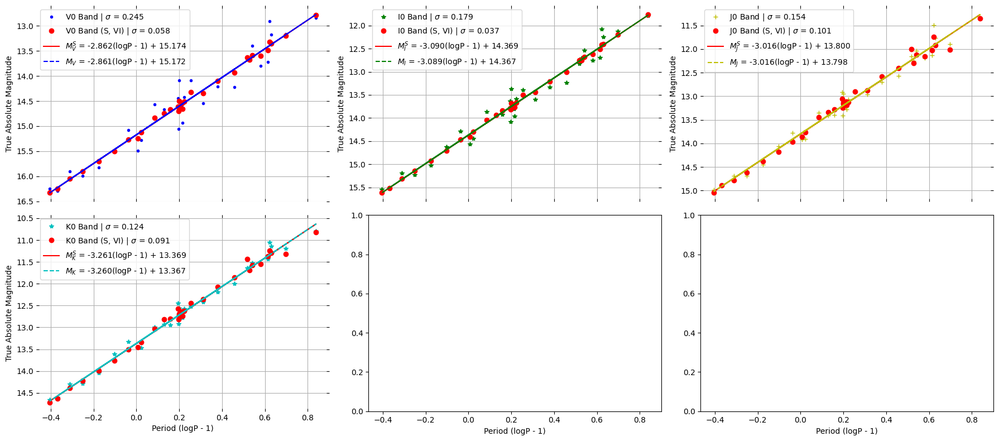

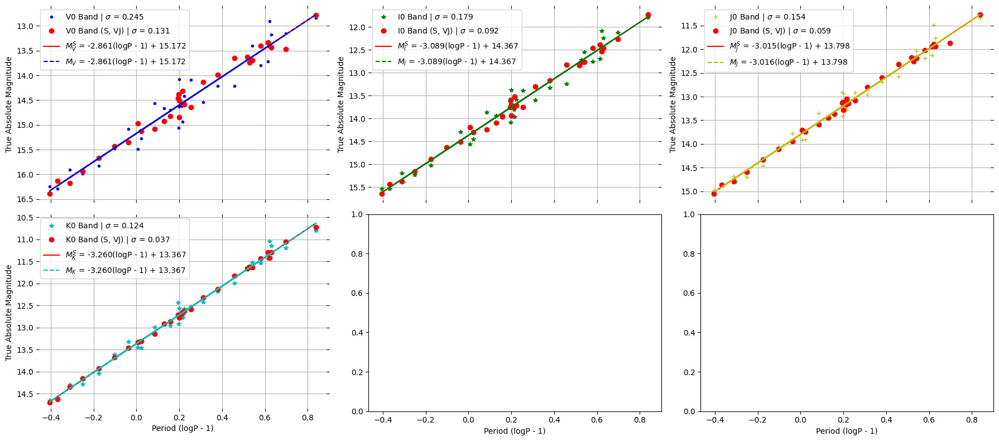

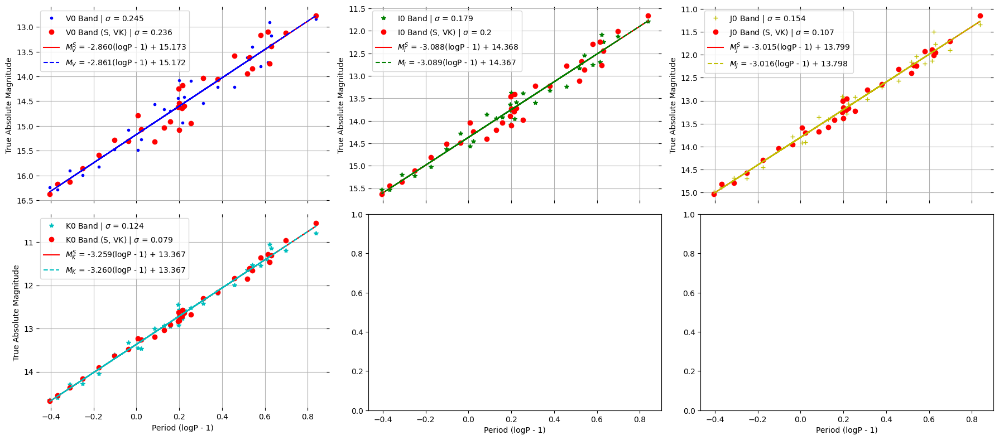

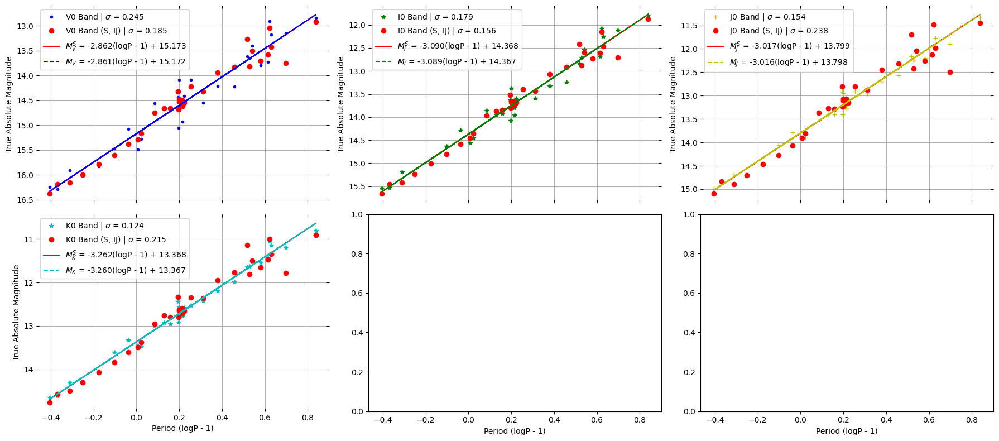

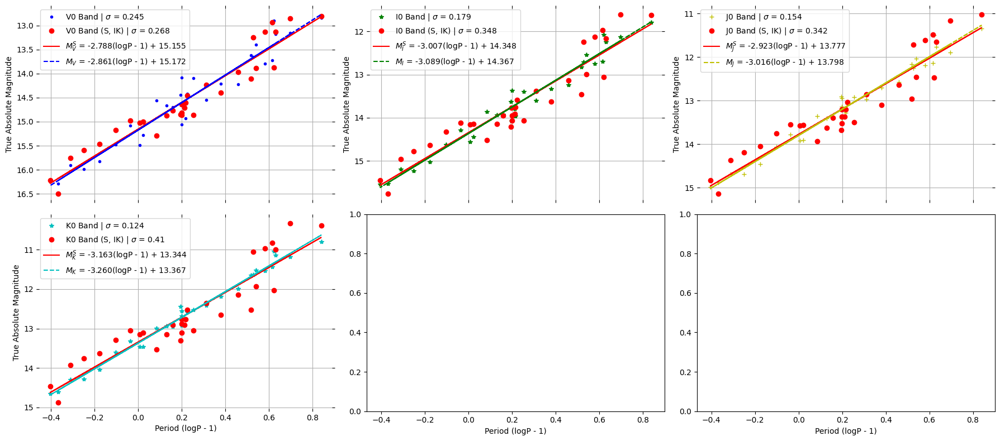

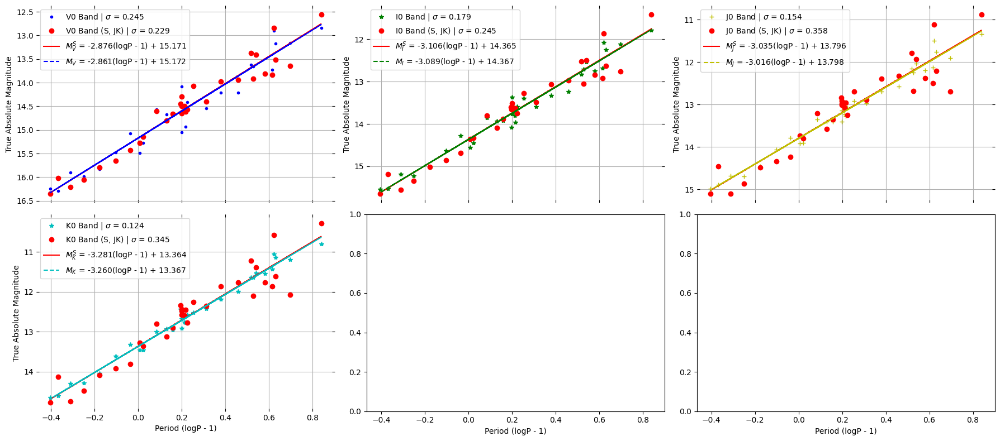

In [1]:
from lvtlaw.g_result import plotresultPL6, plotresultcleanPL6, plotresultPL6_, plotresultPL6_compare
from lvtlaw.h_loadoutput import calibrated_result_
from data.datamapping import *
import pandas as pd
#jesper = pd.read_csv(f'./data/processed/94_jesper_3.23/1_prepared/94_prepared_PLdata.csv')
#print(jesper.info())
#dd = ['BV','VI','VJ','VK','IJ','IH','IK', 'JK', 'JH', 'HK']
dd = ['VI','VJ','VK','IJ','IK', 'JK']

result, r_reg, res, pre = calibrated_result_()
for col in dd:#['BV','VI','VJ','VK','IJ', 'JK']:
    plotresultPL6_(result, r_reg, col, dis_flag[0], 'S', '0',0)
    #plotresultPL6_compare(jesper,result, r_reg, col, dis_flag[0], 'S', '0',0)

In [2]:
from data.datamapping import *
import pandas as pd
col='VK'
f = pd.read_csv(f'./data/input/{file_name}.csv')
f[dis_list[0]] = result[f'muS0{col}{dis_flag[0]}']
f['EBV'] = result[f'rdS0{col}{dis_flag[0]}']
f
f.to_csv(f'./data/input/{file_name}_{col}.csv')
#result.style#[[f'rdS0{col}_j' for col in ['VJ']]]#.style

# Comparing results

In [7]:
from lvtlaw.g_result import print_PL
for col in ['BV','VI','VJ','VK','IJ', 'JK', 'HK']:
    s, m = print_PL(r_reg, col)

PL for BV
B(0.077) = -1.881(0.034) (logP - 1) -3.100(0.009)
V(0.016) = -2.277(0.007) (logP - 1) -3.909(0.002)
I(0.032) = -2.579(0.014) (logP - 1) -4.691(0.004)
J(0.026) = -2.800(0.011) (logP - 1) -5.176(0.003)
H(0.039) = -2.932(0.017) (logP - 1) -5.552(0.005)
K(0.037) = -2.982(0.016) (logP - 1) -5.613(0.004)
PL for VI
B(0.253) = -1.879(0.110) (logP - 1) -3.100(0.030)
V(0.179) = -2.276(0.077) (logP - 1) -3.909(0.021)
I(0.029) = -2.579(0.013) (logP - 1) -4.691(0.003)
J(0.041) = -2.800(0.018) (logP - 1) -5.177(0.005)
H(0.079) = -2.933(0.034) (logP - 1) -5.552(0.009)
K(0.101) = -2.983(0.044) (logP - 1) -5.613(0.012)
PL for VJ
B(0.070) = -1.880(0.030) (logP - 1) -3.100(0.008)
V(0.030) = -2.276(0.013) (logP - 1) -3.909(0.004)
I(0.009) = -2.577(0.004) (logP - 1) -4.691(0.001)
J(0.028) = -2.797(0.012) (logP - 1) -5.177(0.003)
H(0.031) = -2.929(0.013) (logP - 1) -5.552(0.004)
K(0.032) = -2.979(0.014) (logP - 1) -5.613(0.004)
PL for VK
B(0.072) = -1.882(0.031) (logP - 1) -3.100(0.008)
V(0.028) =

# LMC and SMC

In [11]:
LMC = pd.read_csv('data/processed/29_LMC_3.4/8_result/29_corrected.csv')
SMC = pd.read_csv('data/processed/32_SMC_VIJK_2.53/8_result/32_corrected.csv')
SMC.head()

,Unnamed: 0,name,logP,rdS0VI_s,muS0VI_s,VS0VI_s,IS0VI_s,JS0VI_s,KS0VI_s,rdS0VJ_s,...,VS0IK_s,IS0IK_s,JS0IK_s,KS0IK_s,rdS0JK_s,muS0JK_s,VS0JK_s,IS0JK_s,JS0JK_s,KS0JK_s
0,0,HV1328,1.199692,-0.123720,18.335,14.495013,13.680109,13.140945,12.689603,-0.254087,...,14.817441,13.953809,13.362667,12.882088,-0.085950,18.435,14.299453,13.513217,13.004632,12.570491
1,1,HV1333,1.212084,-0.002302,19.395,14.547823,13.705076,13.115213,12.632165,0.009191,...,14.705903,13.905732,13.361283,12.903781,0.003070,19.435,14.494233,13.655563,13.070048,12.589447
2,2,HV1335,1.157800,-0.034718,18.804,14.668838,13.844486,13.281378,12.798568,-0.078206,...,14.766037,13.948526,13.392714,12.914007,0.014269,18.684,14.664899,13.877730,13.354282,12.893780
3,3,HV1345,1.129670,-0.061005,18.891,14.741343,13.940040,13.335650,12.817869,-0.100108,...,14.873681,14.146676,13.621539,13.148336,0.058357,18.531,14.799356,14.088649,13.580895,13.117471
4,4,HV822,1.223807,0.016545,19.038,14.515140,13.664698,13.131093,12.627628,-0.020596,...,14.452026,13.584518,13.032710,12.519005,0.058541,18.878,14.568892,13.750325,13.250719,12.766378


Vl = -2.706552 logP - 1 ( 0.025435) + 14.295991 ( 0.010160)
Vs = -2.861707 logP - 1 ( 0.032908) + 15.173917 ( 0.012866)
Il = -2.959622 logP - 1 ( 0.010407) + 13.604946 ( 0.004157)
Is = -3.089638 logP - 1 ( 0.021172) + 14.369043 ( 0.008278)
Jl = -3.123040 logP - 1 ( 0.068410) + 13.215930 ( 0.027326)
Js = -3.016236 logP - 1 ( 0.057712) + 13.800067 ( 0.022565)
Kl = -3.224539 logP - 1 ( 0.086151) + 12.783597 ( 0.034413)
Ks = -3.260849 logP - 1 ( 0.052127) + 13.368596 ( 0.020381)


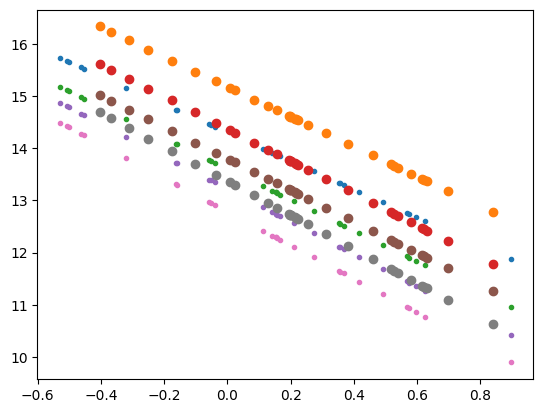

In [4]:
from lvtlaw.a_utils import regression
import matplotlib.pyplot as plt
import pandas as pd
#LMC = pd.read_csv('data/input/23_LMC.csv')
#SMC = pd.read_csv('data/input/32_SMC_VIJK.csv')
col='VI'
xl=LMC['logP']-1
xs=SMC['logP']-1
#xm = new_M['logP']-1
x_str = 'logP - 1'
cl, cs = [], []
for i, m in enumerate(['V', 'I', 'J', 'K']):
    y_str = m
#    yl=LMC[f'{m}_mag']- R[i]*LMC['EBV'] - LMC['IRSB']
    yl=LMC[f'{m}S0{col}_l']#- R[i]*LMC['EBV_lVK'] - LMC['IRSB']
    ys=SMC[f'{m}S0{col}_s']#- R[i]*SMC['EBV'] - SMC['IRSB']
    rl = regression(xl, yl, x_str, y_str+'l', p = 1)
    cl.append(rl[1])
    rs = regression(xs, ys, x_str, y_str+'s', p = 1)
    cs.append(rs[1])
    #plt.plot(xm, new_M[f'{m}_gVK'], 'k.')
    plt.plot(xl, rl[2], '.')
    plt.plot(xs, rs[2], 'o')
#    plt.plot(pre['logP']-1, pre[f'p_{m}0_g'], '+')
    #plt.plot(new_M['logP']-1, new_M[f'{m}_cVK'], '+')
    #plt.plot(xs, rs[2], '--')
    #plt.show()

# Distance to LMC

In [5]:
mag = ['V', 'I', 'J', 'K']
mod_LMC = pd. DataFrame()
for col in ['VI', 'JK']:
    rcg = r_reg[[f'{m}0{col}S' for m in mag]].loc[1].values # Milky Way
    mod_LMC[col+'_p'] = cl - rcg
    #rci = r_reg[[f'{m}0{col}S' for m in mag]].loc[5].values
    #mod_LMC[col+'_i'] = cl - rci 
    #mod_LMC.index = mag
mod_LMC#.mean()

,VI_p,JK_p
0,18.264931,18.267746
1,18.358532,18.355877
2,18.473416,18.466392
3,18.474518,18.465065


# Distance to SMC

In [6]:
mod_SMC = pd. DataFrame()
for col in ['VI', 'JK']:
    rcg = r_reg[[f'{m}0{col}S' for m in mag]].loc[1].values
    mod_SMC[col+'_p'] = cs - rcg
    #rci = result_reg[[f'{m}{col}' for m in mag]].loc[5].values
    #mod_SMC[col+'_i'] = cs - rci 
    #mod_SMC.index = mag
mod_SMC

,VI_p,JK_p
0,19.142857,19.145671
1,19.122630,19.119975
2,19.057553,19.050529
3,19.059517,19.050064


In [ ]:
!pdflatex pipeline.tex